In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Chapter 8 - Advanced Data Analysis

In [2]:
data = pd.read_csv("fraserDataWithRGDPPC.csv", 
                     index_col = [0,1],
                  parse_dates = True).rename(columns = {"Summary":"EFW"})
data

ISO_Code_2   World Bank Region  \
ISO_Code_3 Year                                        
AGO        1970-01-01         AO  Sub-Saharan Africa   
           1975-01-01         AO  Sub-Saharan Africa   
           1980-01-01         AO  Sub-Saharan Africa   
           1985-01-01         AO  Sub-Saharan Africa   
           1990-01-01         AO  Sub-Saharan Africa   
...                          ...                 ...   
ZWE        2016-01-01         ZW  Sub-Saharan Africa   
           2017-01-01         ZW  Sub-Saharan Africa   
           2018-01-01         ZW  Sub-Saharan Africa   
           2019-01-01         ZW  Sub-Saharan Africa   
           2020-01-01         ZW  Sub-Saharan Africa   

                      World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income)  \
ISO_Code_3 Year                                                                                                                                              
AGO        1970-01-01                                                NaN                                                                                     
           1975-01-01                                                NaN                                                                                     
           1980-01-01                                                NaN                                                                                     
           1985-01-01                                                NaN                                                                                     
           1990-01-01                                                 LM                                                                                     
...                                                                  ...                                                                                     
ZWE        2016-01-01                                                  L                                                                                     
           2017-01-01                                                  L                                                                                     
           2018-01-01                                                 LM                                                                                     
           2019-01-01                                                 LM                                                                                     
           2020-01-01                                                 LM                                                                                     

                      Countries       EFW  Size of Government  \
ISO_Code_3 Year                                                 
AGO        1970-01-01    Angola       NaN                 NaN   
           1975-01-01    Angola       NaN                 NaN   
           1980-01-01    Angola       NaN                 NaN   
           1985-01-01    Angola       NaN                 NaN   
           1990-01-01    Angola       NaN                 NaN   
...                         ...       ...                 ...   
ZWE        2016-01-01  Zimbabwe  6.121996            5.332597   
           2017-01-01  Zimbabwe  5.599886            4.699843   
           2018-01-01  Zimbabwe  5.876298            5.170946   
           2019-01-01  Zimbabwe  4.719465            5.628359   
           2020-01-01  Zimbabwe  4.480000            5.562008   

                       Legal System and Property Rights  Sound Money  \
ISO_Code_3 Year                                                        
AGO        1970-01-01                               NaN          NaN   
           1975-01-01                               NaN          NaN   
           1980-01-01                               NaN          NaN   
           1985-01-01           

In [3]:
data.index[0]

('AGO', Timestamp('1970-01-01 00:00:00'))

## Isolate each individual that comprises the multiindex

In [4]:
countries = data.index.get_level_values("ISO_Code_3").unique()
countries

Index(['AGO', 'ALB', 'ARE', 'ARG', 'ARM', 'AUS', 'AUT', 'AZE', 'BDI', 'BEL',
       ...
       'UGA', 'UKR', 'URY', 'USA', 'VEN', 'VNM', 'YEM', 'ZAF', 'ZMB', 'ZWE'],
      dtype='object', name='ISO_Code_3', length=165)

In [5]:
years = data.index.get_level_values("Year").unique()
years

DatetimeIndex(['1970-01-01', '1975-01-01', '1980-01-01', '1985-01-01',
               '1990-01-01', '1995-01-01', '2000-01-01', '2001-01-01',
               '2002-01-01', '2003-01-01', '2004-01-01', '2005-01-01',
               '2006-01-01', '2007-01-01', '2008-01-01', '2009-01-01',
               '2010-01-01', '2011-01-01', '2012-01-01', '2013-01-01',
               '2014-01-01', '2015-01-01', '2016-01-01', '2017-01-01',
               '2018-01-01', '2019-01-01', '2020-01-01'],
              dtype='datetime64[ns]', name='Year', freq=None)

In [6]:
index_name = data.index.names[0]
indicator_name = "North America"
countries_in_north_america = [
    "BHS", "BRB", "BLZ", "CAN", "CRI", "DOM", "SLV",
    "GTM", "HTI", "HND", "JAM", "MEX", "NIC", "PAN",
    "TTO", "USA"]  

def create_indicator_variable(data, indicator_name, 
                              index_name, target_index_list):
    data[indicator_name] = 0
    data[indicator_name][data.index.get_level_values(
        index_name).isin(target_index_list)] = 1

create_indicator_variable(data = data, indicator_name = indicator_name, 
                              index_name = index_name, target_index_list=countries_in_north_america)
data.loc["USA"]

C:\Users\hthog\AppData\Local\Temp\ipykernel_5412\3954288911.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[indicator_name][data.index.get_level_values(


,ISO_Code_2,World Bank Region,"World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income)",Countries,EFW,Size of Government,Legal System and Property Rights,Sound Money,Freedom to Trade Internationally,Regulation,Standard Deviation of the 5 EFW Areas,RGDP Per Capita,North America
Year,,,,,,,,,,,,,
1970-01-01,US,North America,NaN,United States,7.615181,5.341231,8.286741,9.588817,8.232334,6.631262,1.648185,23958.0000,1
1975-01-01,US,North America,NaN,United States,7.907324,5.336851,8.670280,9.067438,8.412407,8.042706,1.483975,25956.0000,1
1980-01-01,US,North America,NaN,United States,8.101368,5.788734,8.684269,9.122306,8.544966,8.359863,1.322304,29611.0000,1
1985-01-01,US,North America,NaN,United States,8.295413,6.582616,8.726823,9.339660,8.505198,8.335644,1.031484,33023.0000,1
1990-01-01,US,North America,H,United States,8.461126,7.262163,8.350956,9.669842,8.537828,8.477998,0.853932,36982.0000,1
1995-01-01,US,North America,H,United States,8.588435,7.446569,8.587870,9.787931,8.594211,8.538840,0.828418,39390.6254,1
2000-01-01,US,North America,H,United States,8.648077,7.704726,8.773170,9.607665,8.466601,8.739485,0.683215,45886.4705,1
2001-01-01,US,North America,H,United States,8.509072,7.521319,8.615158,9.612028,8.397002,8.464019,0.744511,45878.0092,1
2002-01-01,US,North America,H,United States,8.568646,7.673536,8.370127,9.724310,8.298912,8.819880,0.760212,46266.2959,1


## Plotting Indicator Variables in Scatter

C:\Users\hthog\AppData\Local\Temp\ipykernel_5412\3957794067.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize = (20,12))


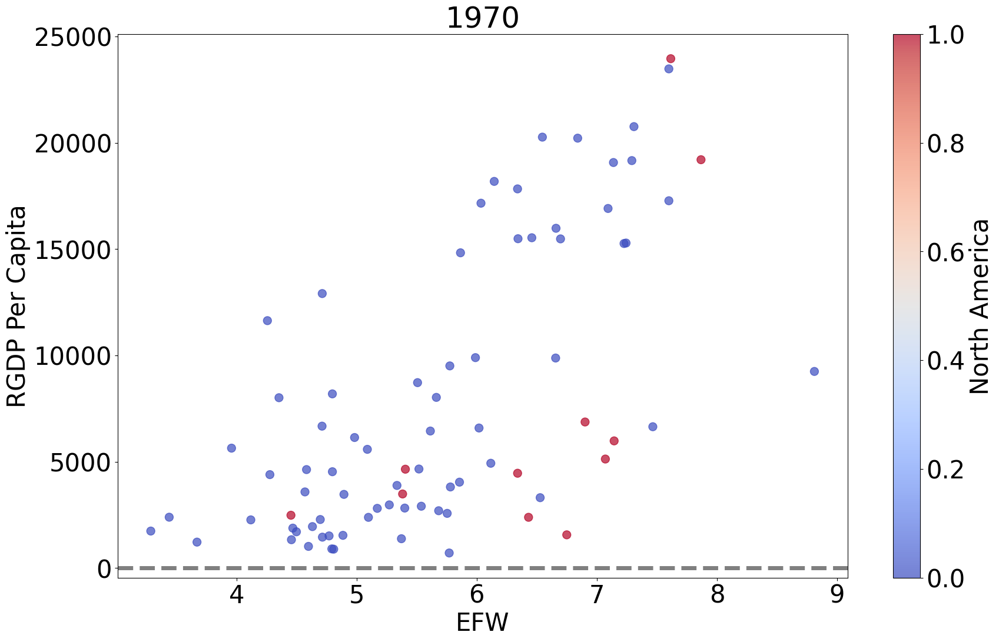

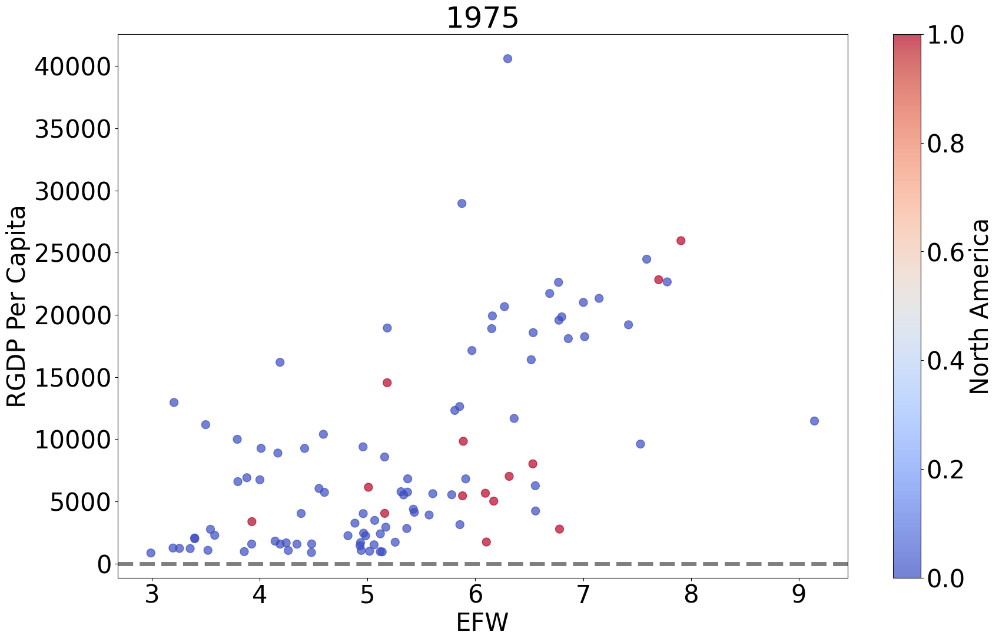

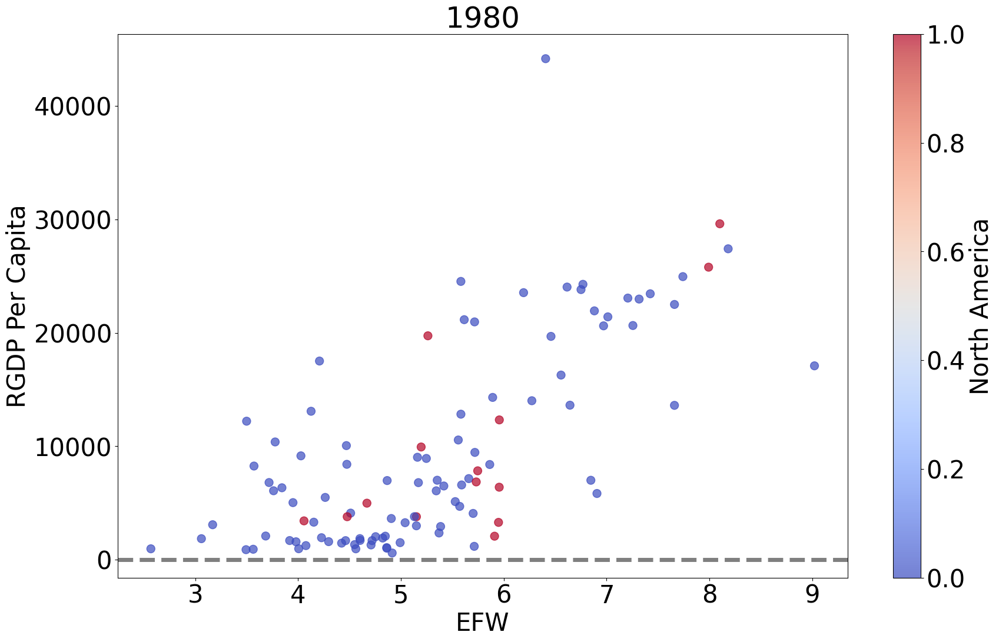

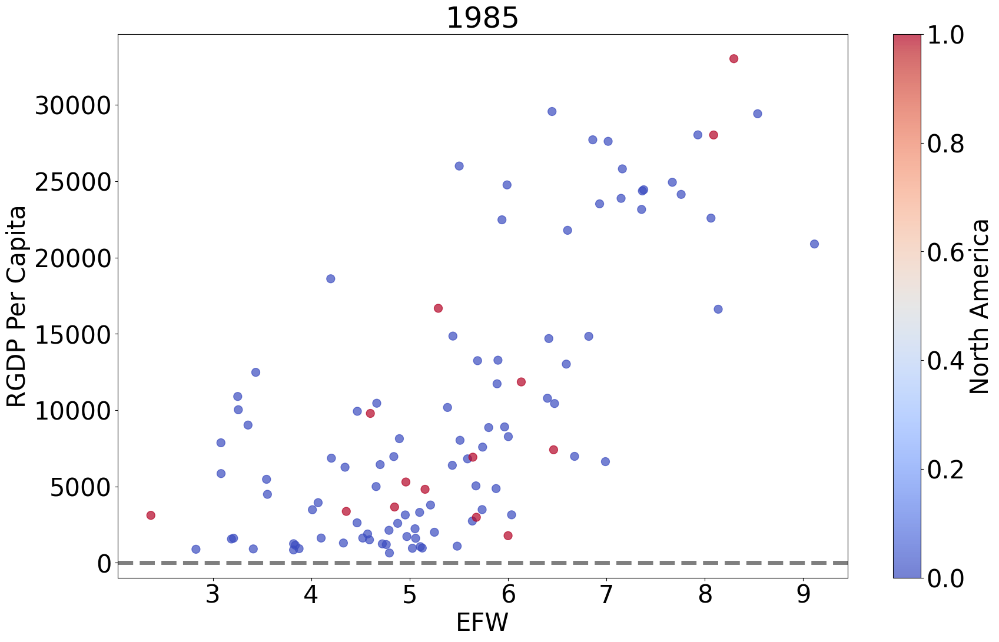

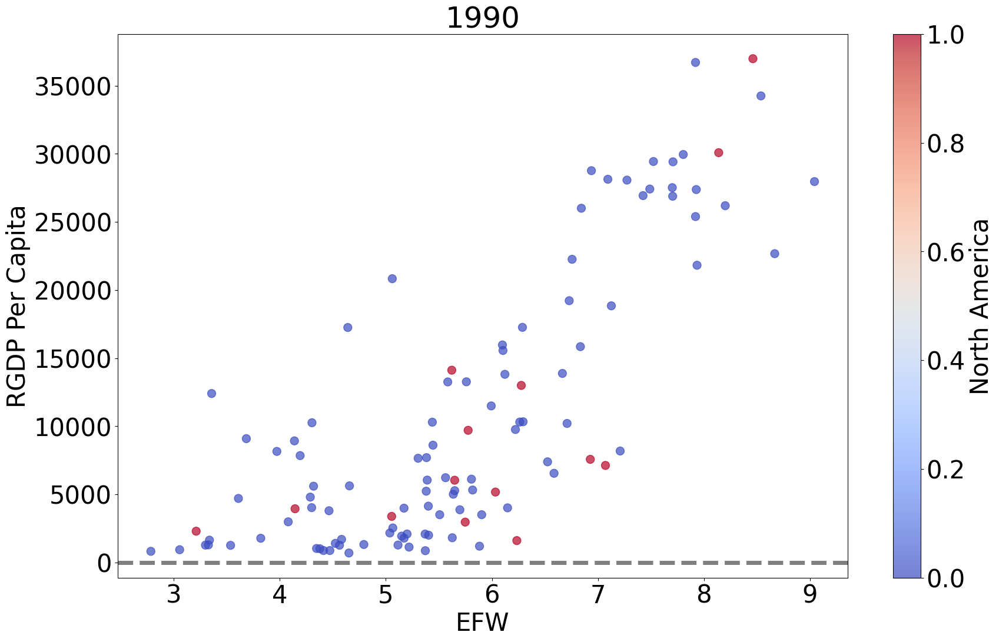

...

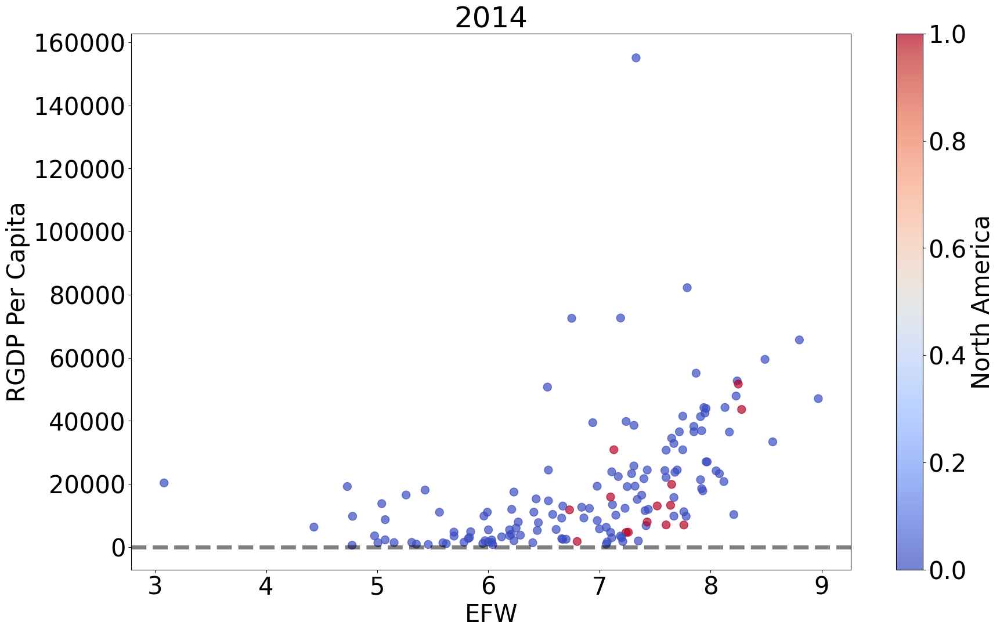

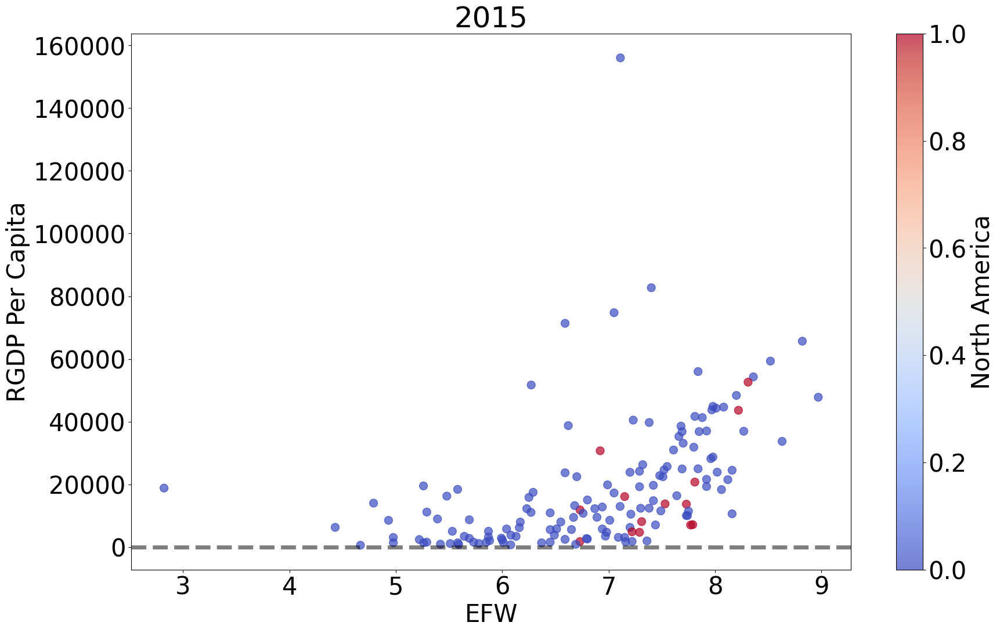

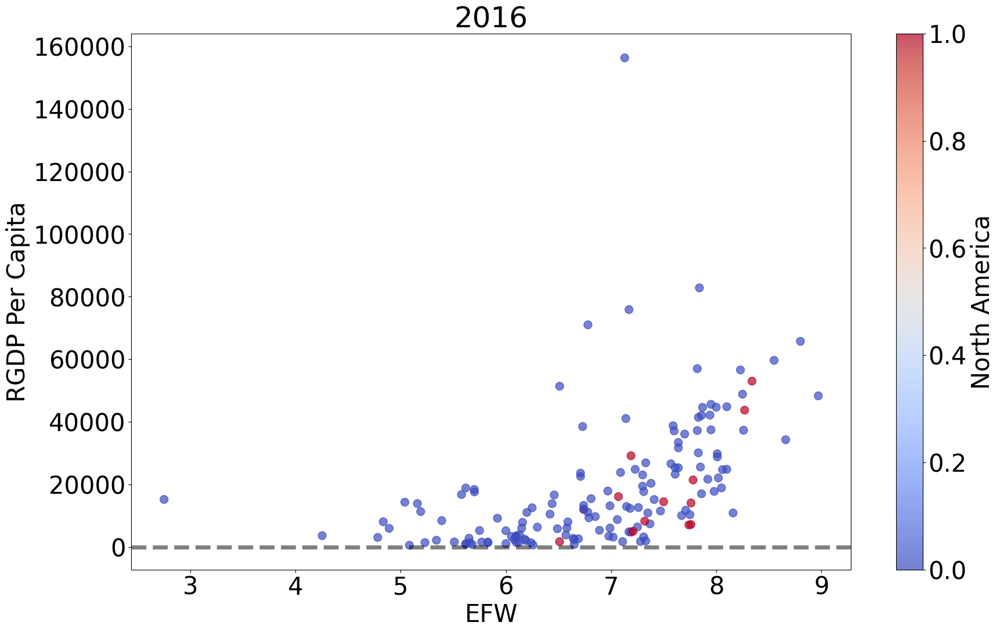

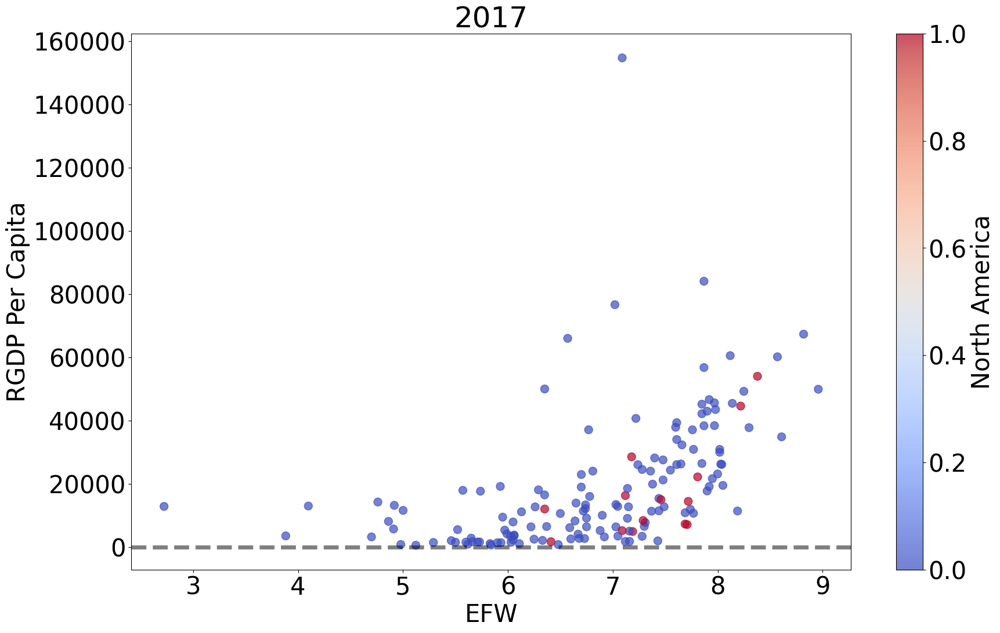

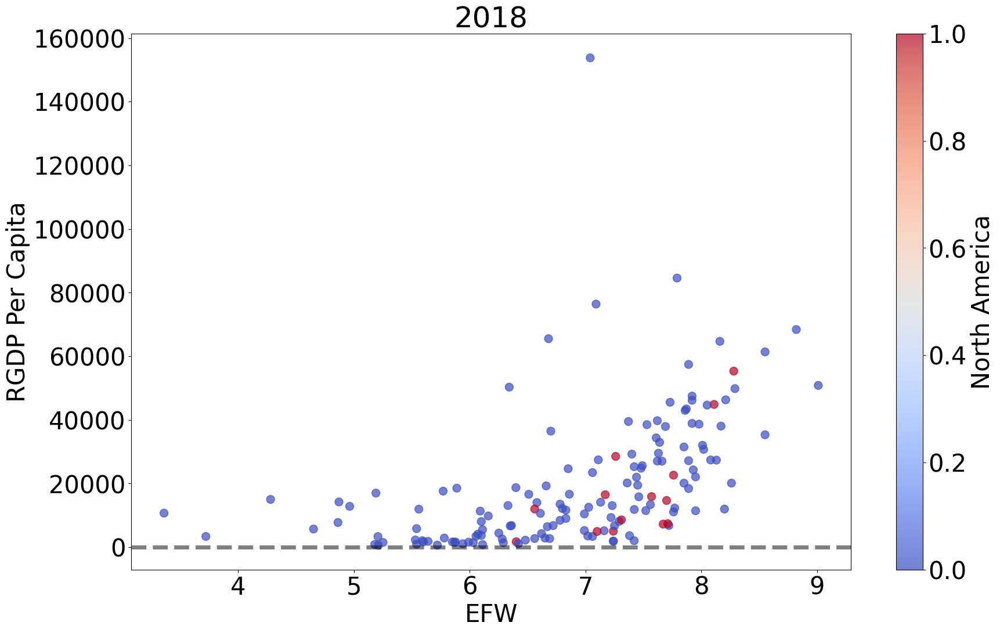

In [7]:
plt.rcParams.update({"font.size":30})
#year = 2000
years = sorted(data.dropna(subset = ["RGDP Per Capita"]).index.get_level_values("Year").unique())
for year in years:
    plot_data = data[data.index.get_level_values("Year") == str(year)]
    fig, ax = plt.subplots(figsize = (20,12))
    plot_data.plot.scatter(x = "EFW",
                          y = "RGDP Per Capita",
                          c = "North America",
                          cmap = "coolwarm",
                          s = 100,
                          alpha = 0.7,
                          ax =ax)
    ax.set_title(str(year)[:4])
    ax.axhline(0, ls="--", color = "k", alpha = 0.5, linewidth = 5)

C:\Users\hthog\AppData\Local\Temp\ipykernel_5412\2048801809.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize = (20,12))


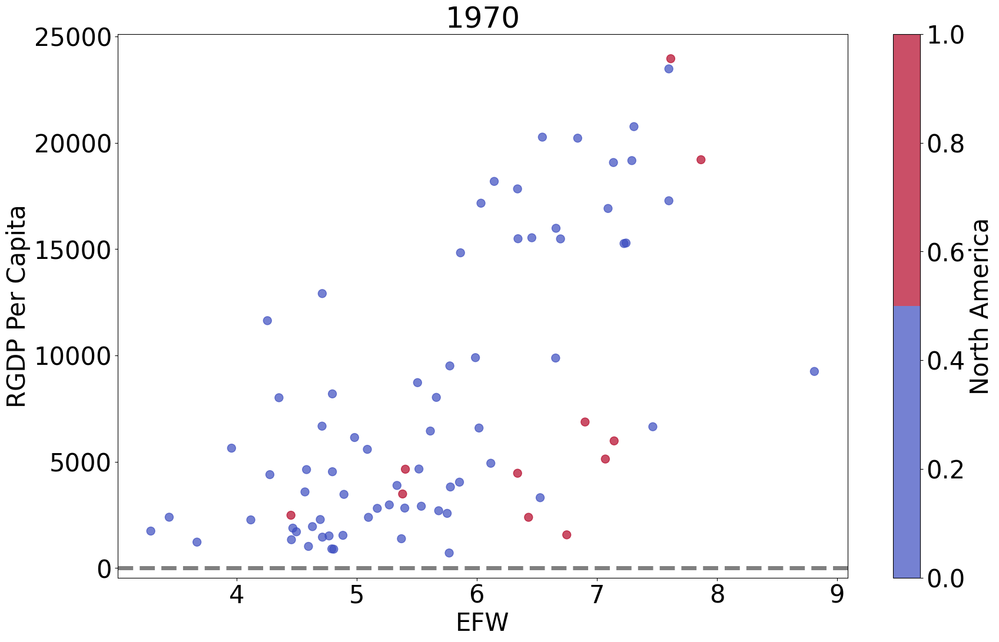

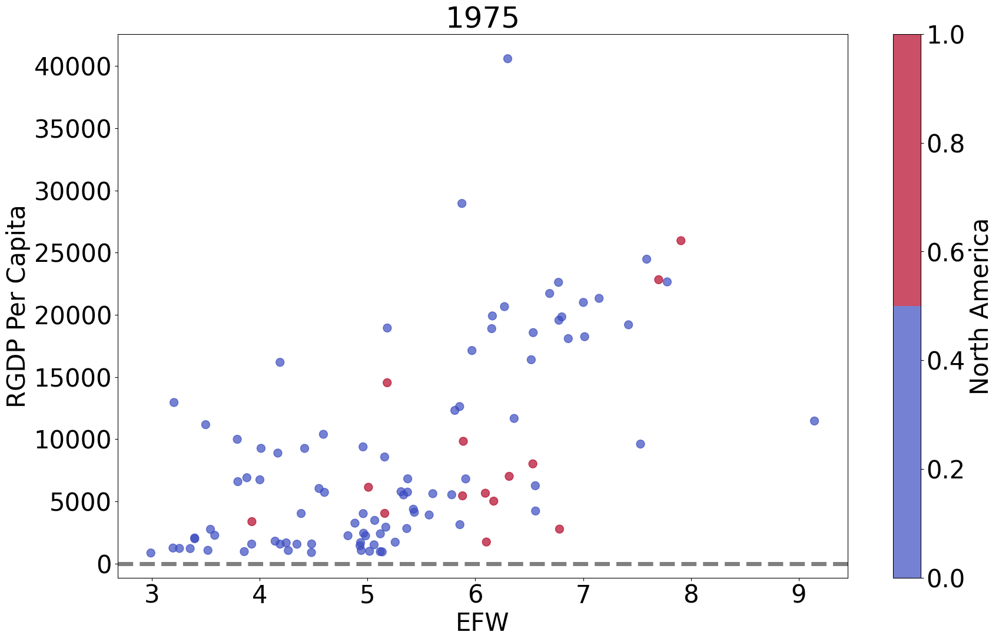

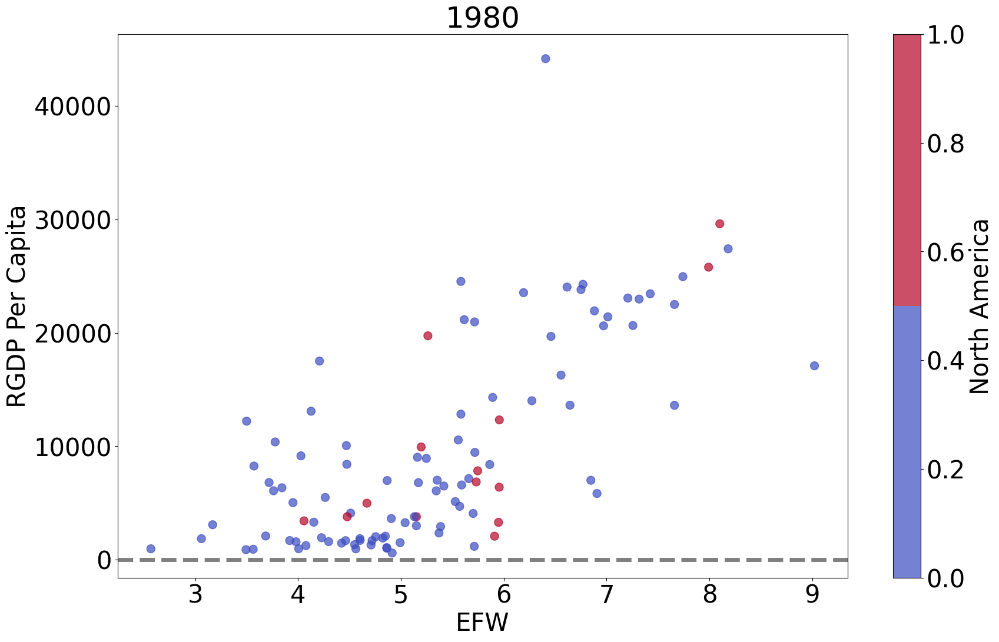

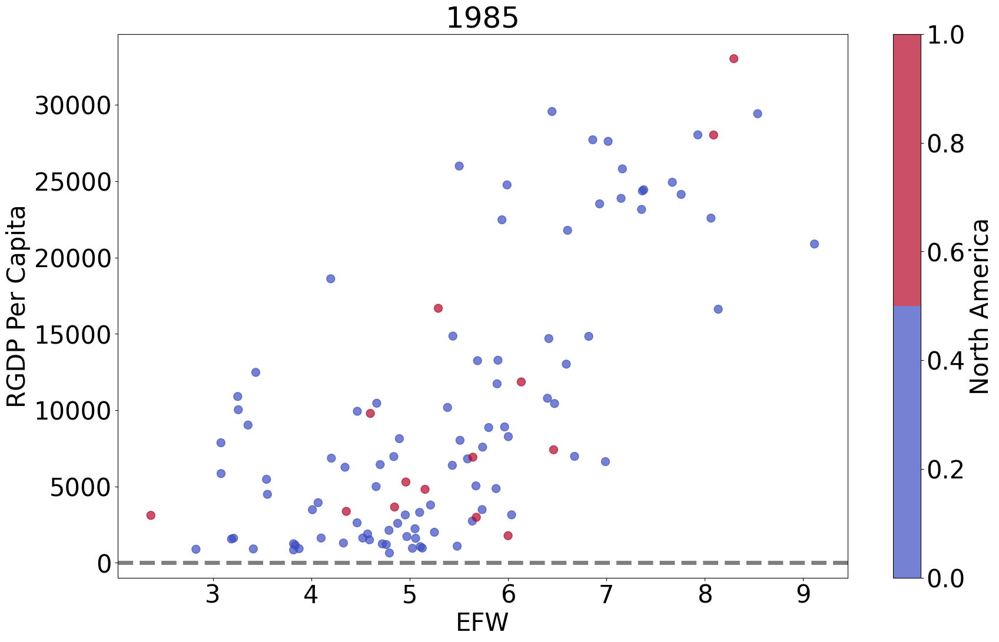

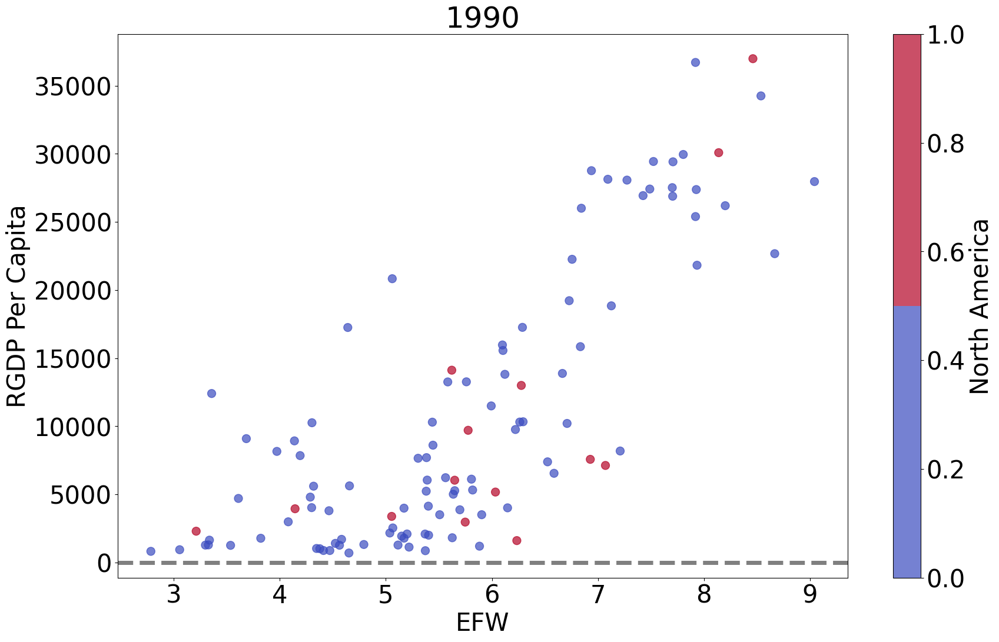

...

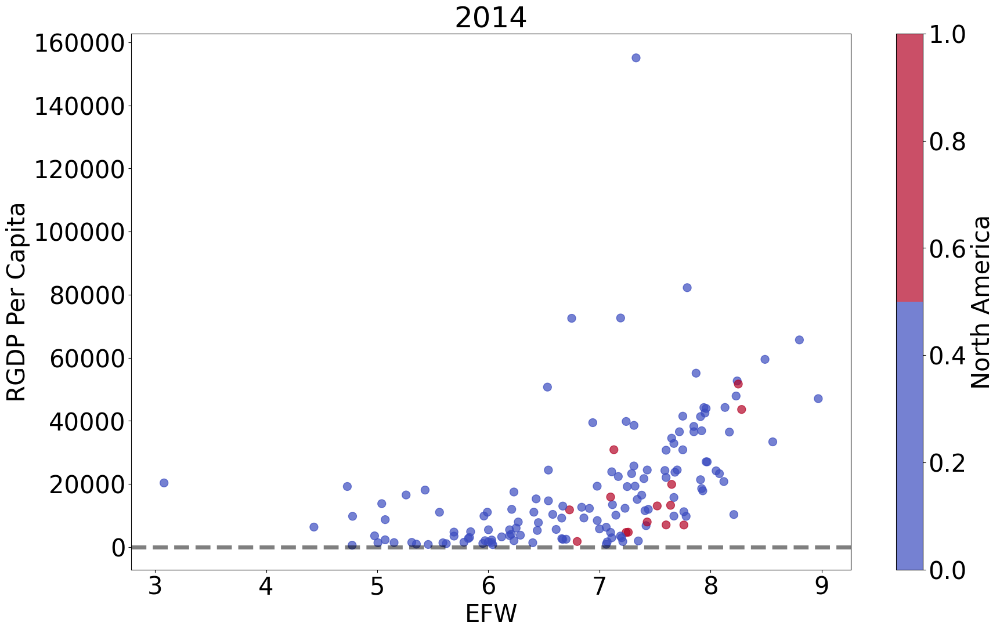

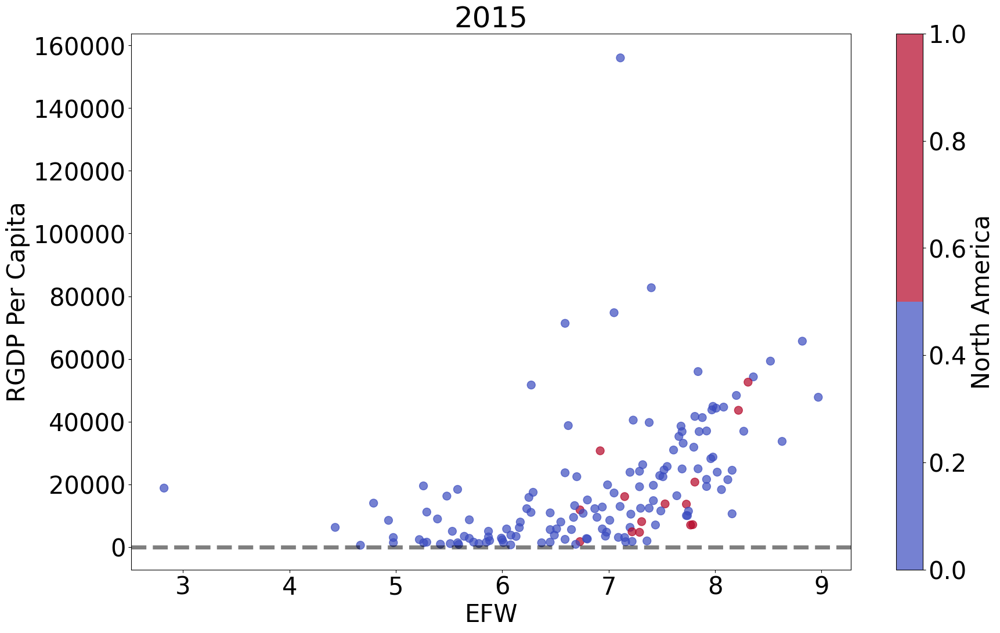

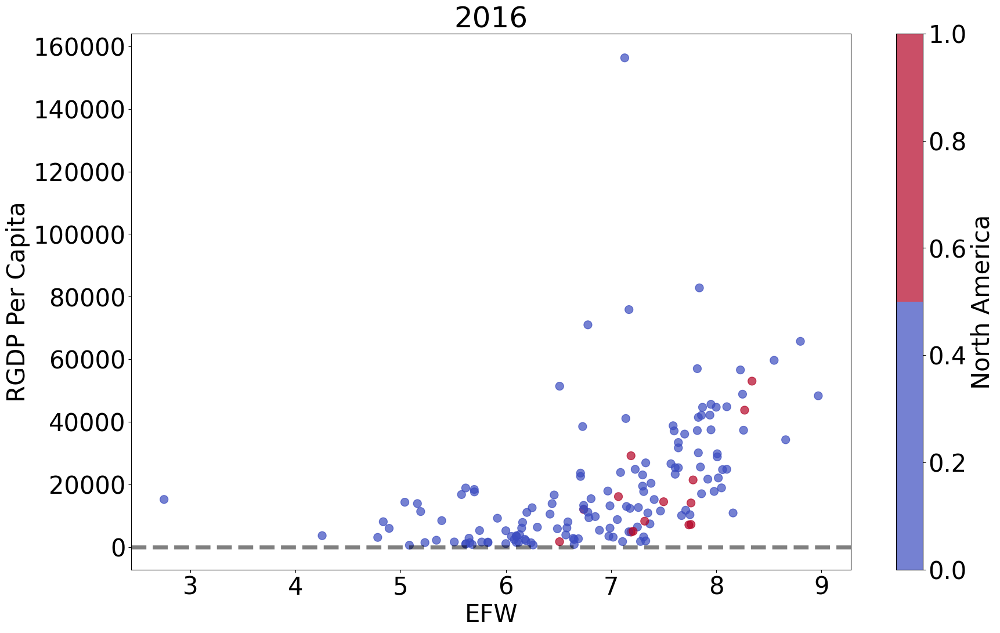

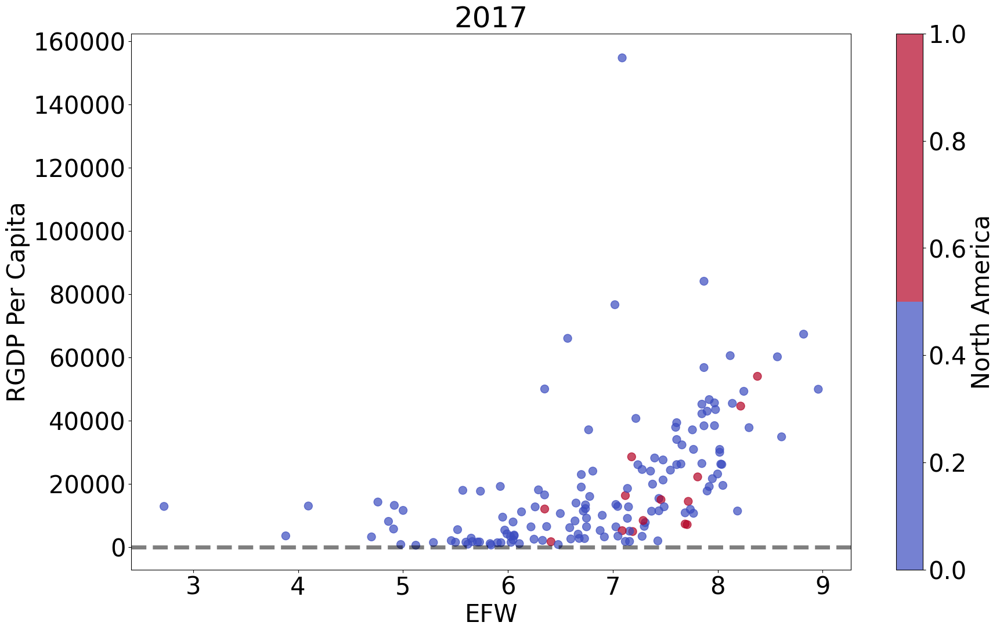

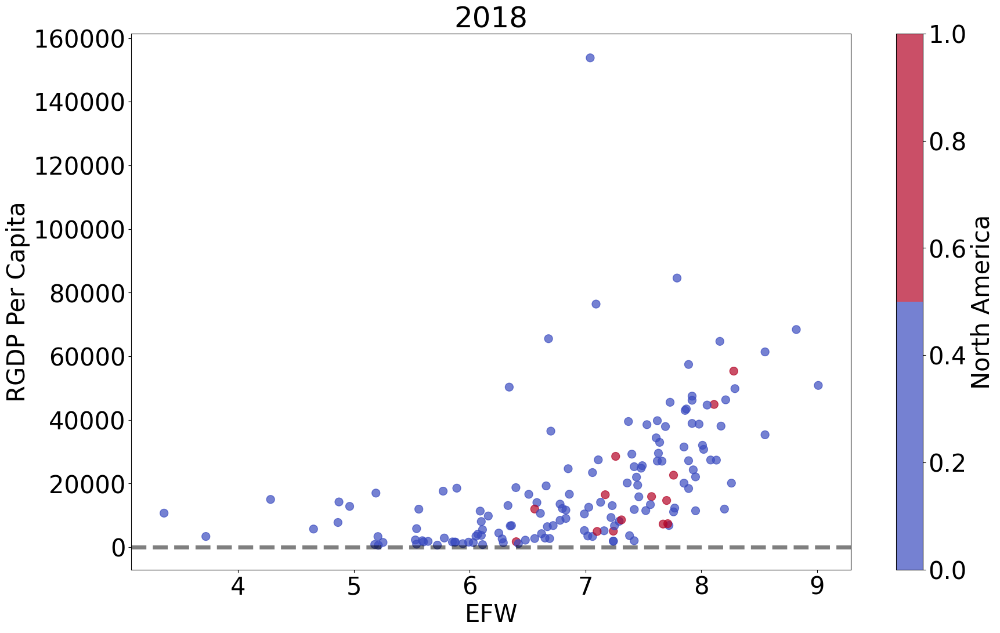

In [8]:
from matplotlib import cm
plt.rcParams.update({"font.size":30})
#year = 2000
years = sorted(data.dropna(subset = ["RGDP Per Capita"]).index.get_level_values("Year").unique())
norm = cm.colors.Normalize()
cmap = cm.get_cmap("coolwarm", 2)
for year in years:
    plot_data = data[data.index.get_level_values("Year") == str(year)]
    fig, ax = plt.subplots(figsize = (20,12))
    plot_data.plot.scatter(x = "EFW",
                          y = "RGDP Per Capita",
                          c = "North America",
                          cmap = cmap,
                          s = 100,
                          alpha = 0.7,
                          ax =ax)
    ax.set_title(str(year)[:4])
    ax.axhline(0, ls="--", color = "k", alpha = 0.5, linewidth = 5)

In [9]:
n = 5
quantile_var = "RGDP Per Capita"
quantile_name = quantile_var + " " + str(n) + "-tile"
data[quantile_name] = np.nan
data

ISO_Code_2   World Bank Region  \
ISO_Code_3 Year                                        
AGO        1970-01-01         AO  Sub-Saharan Africa   
           1975-01-01         AO  Sub-Saharan Africa   
           1980-01-01         AO  Sub-Saharan Africa   
           1985-01-01         AO  Sub-Saharan Africa   
           1990-01-01         AO  Sub-Saharan Africa   
...                          ...                 ...   
ZWE        2016-01-01         ZW  Sub-Saharan Africa   
           2017-01-01         ZW  Sub-Saharan Africa   
           2018-01-01         ZW  Sub-Saharan Africa   
           2019-01-01         ZW  Sub-Saharan Africa   
           2020-01-01         ZW  Sub-Saharan Africa   

                      World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income)  \
ISO_Code_3 Year                                                                                                                                              
AGO        1970-01-01                                                NaN                                                                                     
           1975-01-01                                                NaN                                                                                     
           1980-01-01                                                NaN                                                                                     
           1985-01-01                                                NaN                                                                                     
           1990-01-01                                                 LM                                                                                     
...                                                                  ...                                                                                     
ZWE        2016-01-01                                                  L                                                                                     
           2017-01-01                                                  L                                                                                     
           2018-01-01                                                 LM                                                                                     
           2019-01-01                                                 LM                                                                                     
           2020-01-01                                                 LM                                                                                     

                      Countries       EFW  Size of Government  \
ISO_Code_3 Year                                                 
AGO        1970-01-01    Angola       NaN                 NaN   
           1975-01-01    Angola       NaN                 NaN   
           1980-01-01    Angola       NaN                 NaN   
           1985-01-01    Angola       NaN                 NaN   
           1990-01-01    Angola       NaN                 NaN   
...                         ...       ...                 ...   
ZWE        2016-01-01  Zimbabwe  6.121996            5.332597   
           2017-01-01  Zimbabwe  5.599886            4.699843   
           2018-01-01  Zimbabwe  5.876298            5.170946   
           2019-01-01  Zimbabwe  4.719465            5.628359   
           2020-01-01  Zimbabwe  4.480000            5.562008   

                       Legal System and Property Rights  Sound Money  \
ISO_Code_3 Year                                                        
AGO        1970-01-01                               NaN          NaN   
           1975-01-01                               NaN          NaN   
           1980-01-01                               NaN          NaN   
           1985-01-01           

In [10]:
def create_quantile(n, 
                    data, 
                    year, 
                    quantile_var,
                    quantile_name):  
    year_index = data.index.get_level_values("Year") == year  
    quantile_values_dict = {i:data[year_index][quantile_var]\
                            .quantile(i/n) for i in range(1, n + 1)}  
    for index in data[year_index].index:  
        val = data.loc[index][quantile_var]  
        for i in range(1, n + 1):  
            if val <= quantile_values_dict[i]:  
                data.loc[index,[quantile_name]]=int((n + 1) - i)  
                break   
            else:  
                 continue  
for year in years:
    create_quantile(n, data, year, quantile_var, quantile_name)
data.loc["USA"].dropna()

,ISO_Code_2,World Bank Region,"World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income)",Countries,EFW,Size of Government,Legal System and Property Rights,Sound Money,Freedom to Trade Internationally,Regulation,Standard Deviation of the 5 EFW Areas,RGDP Per Capita,North America,RGDP Per Capita 5-tile
Year,,,,,,,,,,,,,,
1990-01-01,US,North America,H,United States,8.461126,7.262163,8.350956,9.669842,8.537828,8.477998,0.853932,36982.0000,1,1.0
1995-01-01,US,North America,H,United States,8.588435,7.446569,8.587870,9.787931,8.594211,8.538840,0.828418,39390.6254,1,1.0
2000-01-01,US,North America,H,United States,8.648077,7.704726,8.773170,9.607665,8.466601,8.739485,0.683215,45886.4705,1,1.0
2001-01-01,US,North America,H,United States,8.509072,7.521319,8.615158,9.612028,8.397002,8.464019,0.744511,45878.0092,1,1.0
2002-01-01,US,North America,H,United States,8.568646,7.673536,8.370127,9.724310,8.298912,8.819880,0.760212,46266.2959,1,1.0
2003-01-01,US,North America,H,United States,8.558717,7.866283,8.257379,9.743489,8.338465,8.662287,0.712756,47157.9953,1,1.0
2004-01-01,US,North America,H,United States,8.618290,8.071277,8.139297,9.753433,8.378804,8.786829,0.689687,48492.7171,1,1.0
2005-01-01,US,North America,H,United States,8.509323,7.892833,7.937832,9.704102,8.289870,8.736210,0.747288,49654.7614,1,1.0
2006-01-01,US,North America,H,United States,8.509323,7.871725,7.874278,9.650034,8.305433,8.861652,0.754435,50489.8600,1,1.0


C:\Users\hthog\AppData\Local\Temp\ipykernel_5412\1695751374.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize = (24, 16))


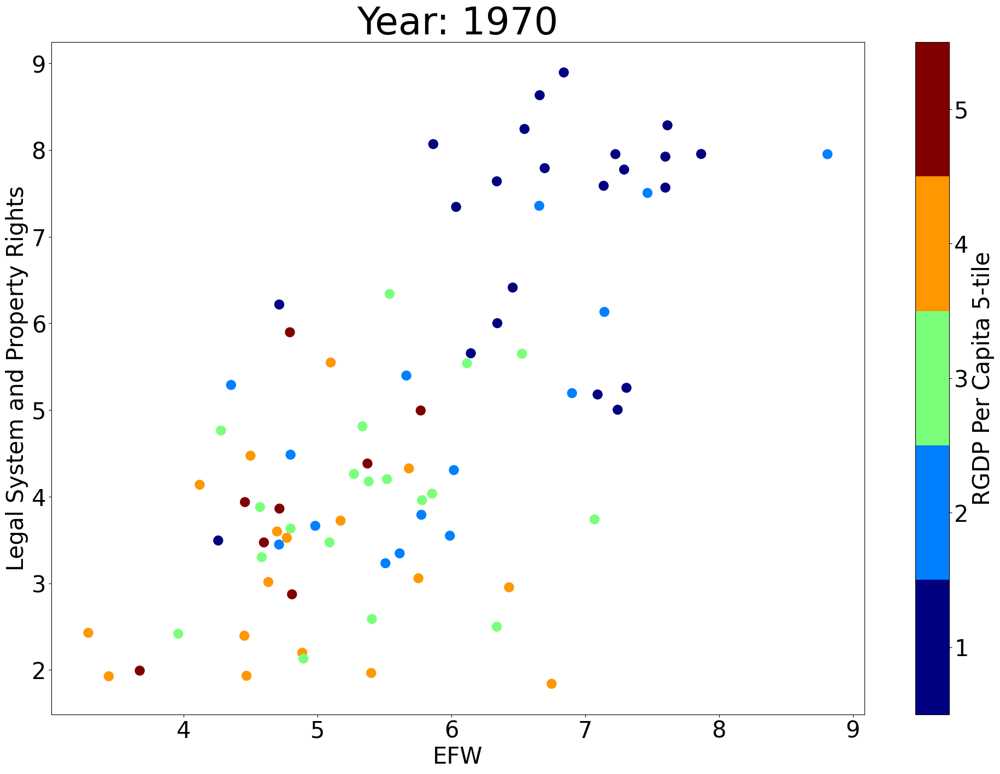

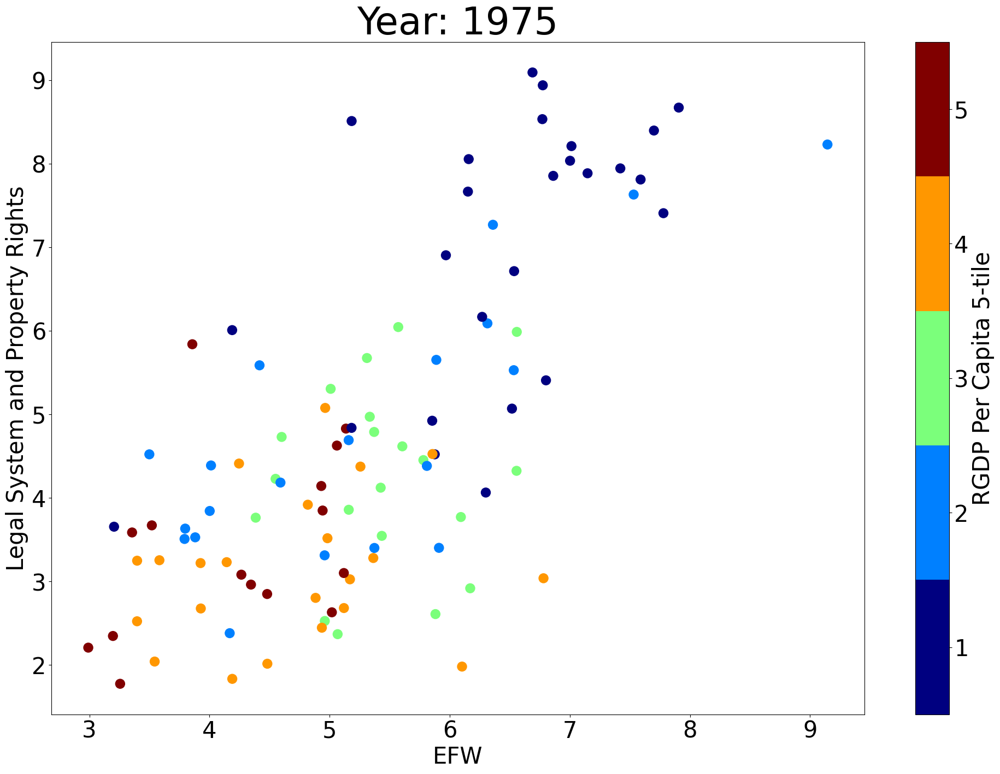

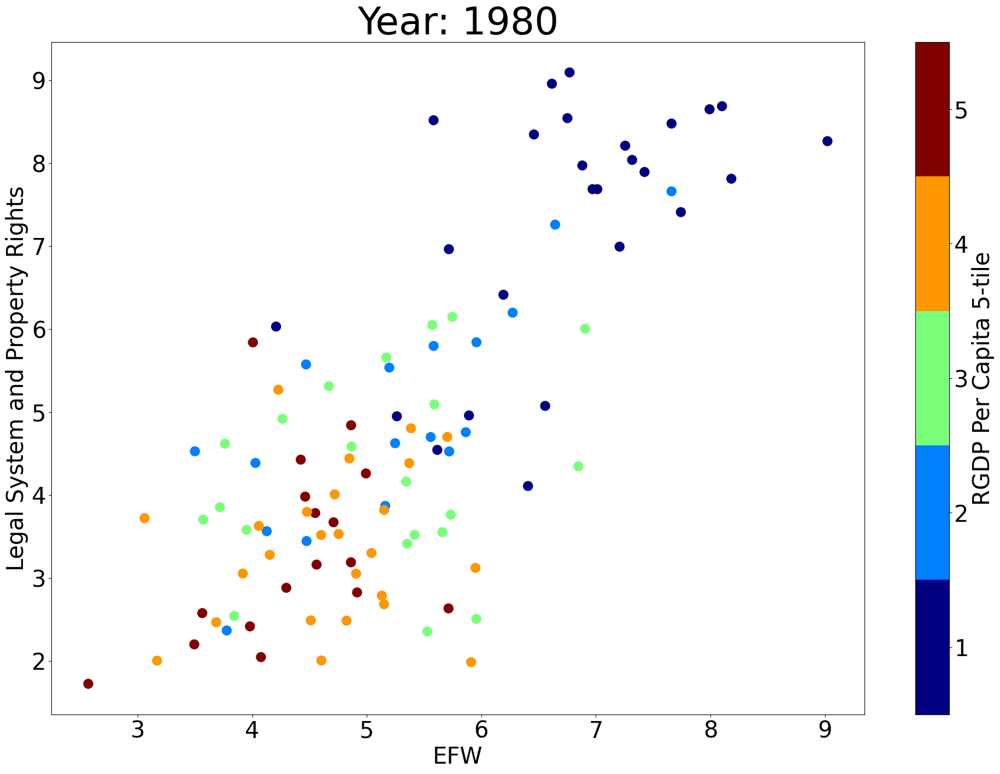

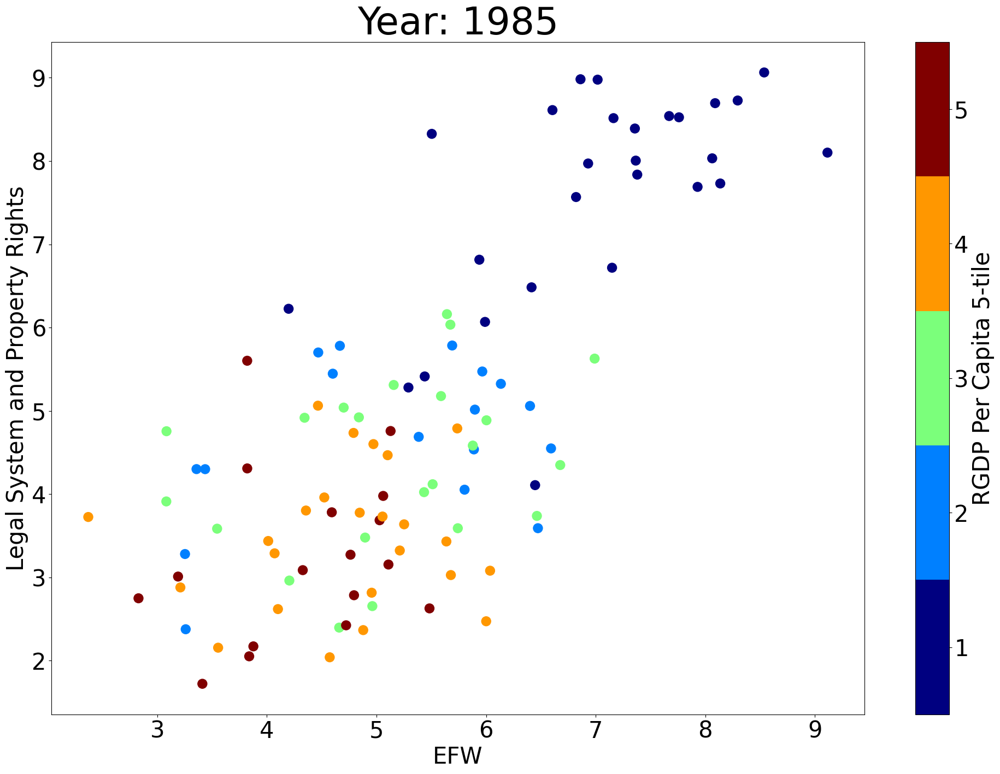

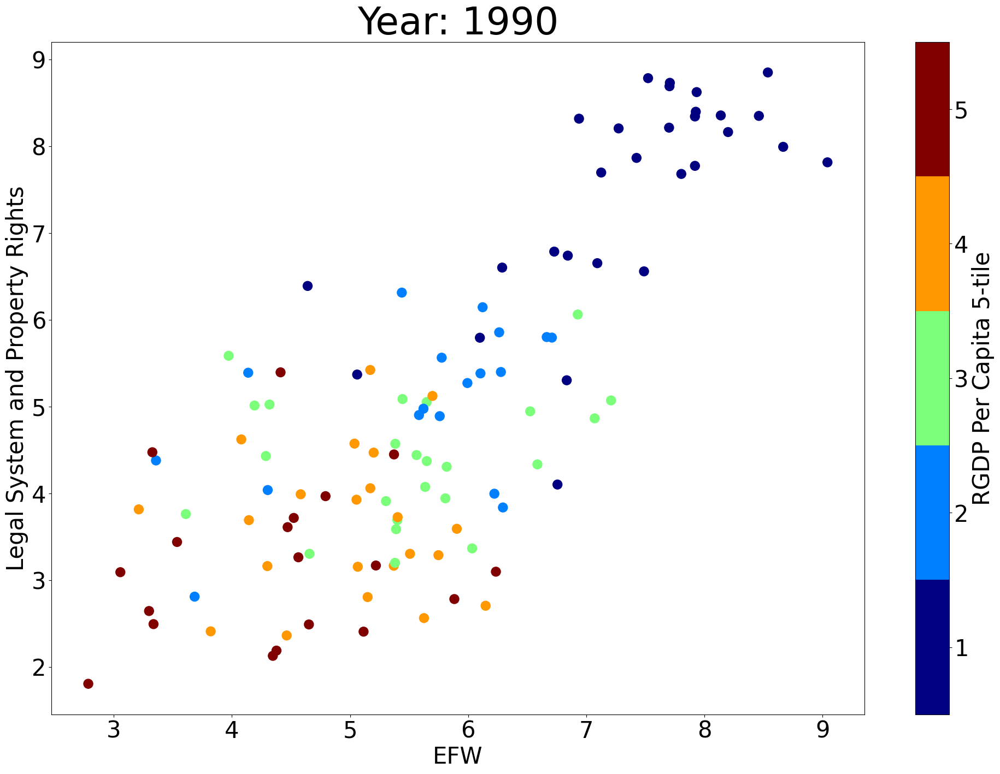

...

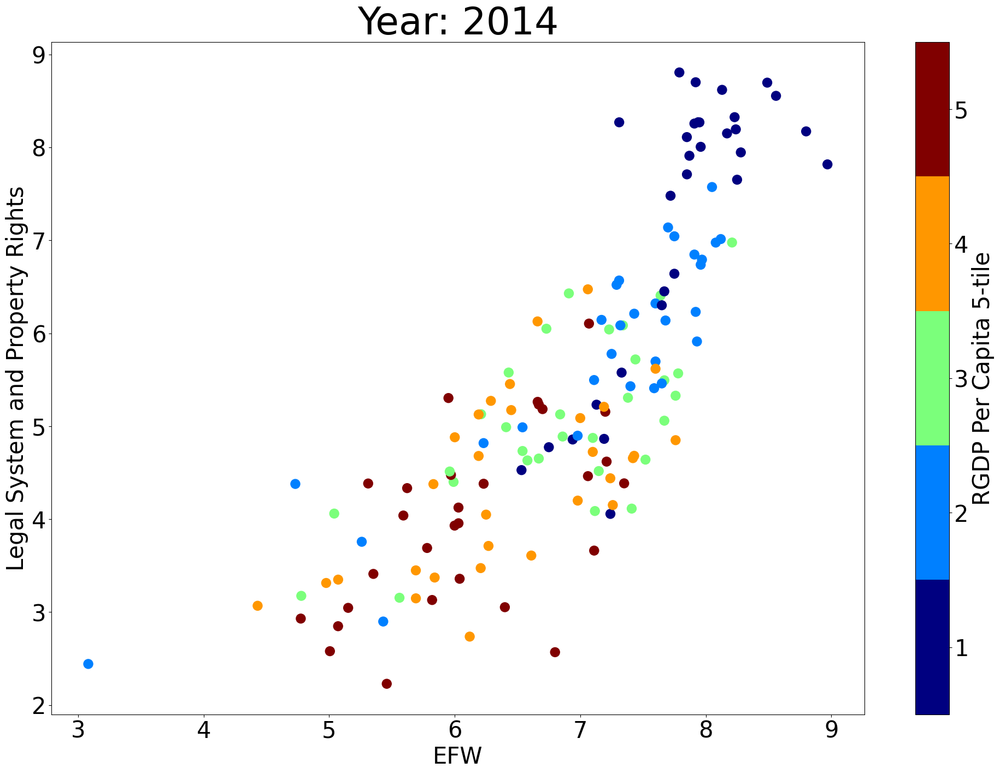

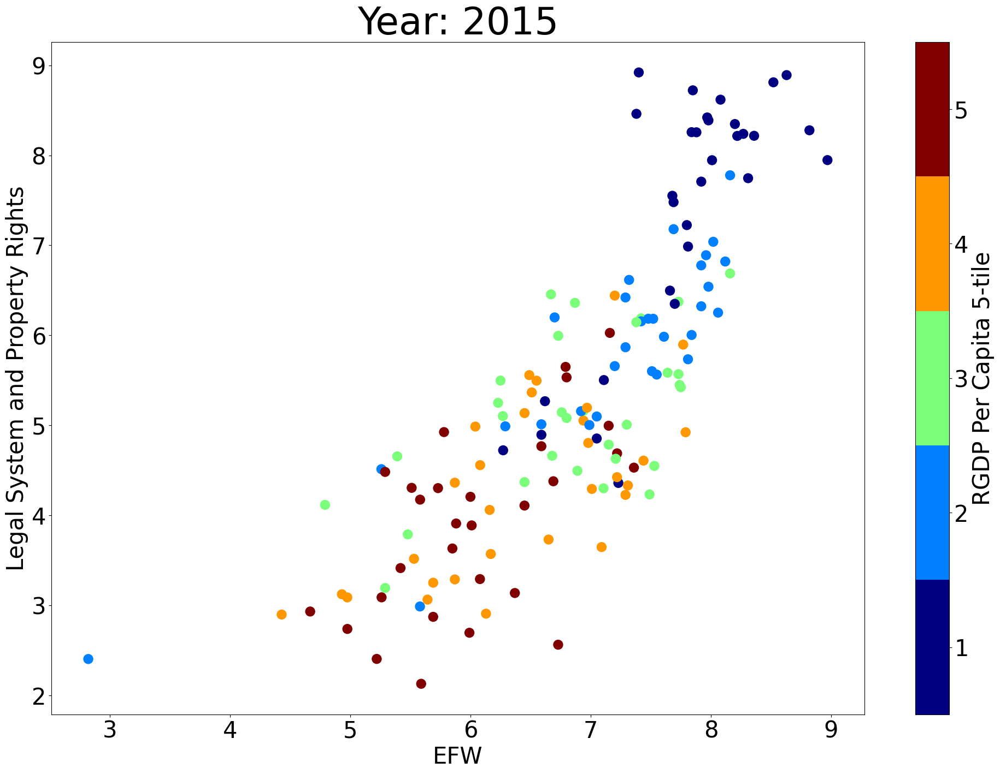

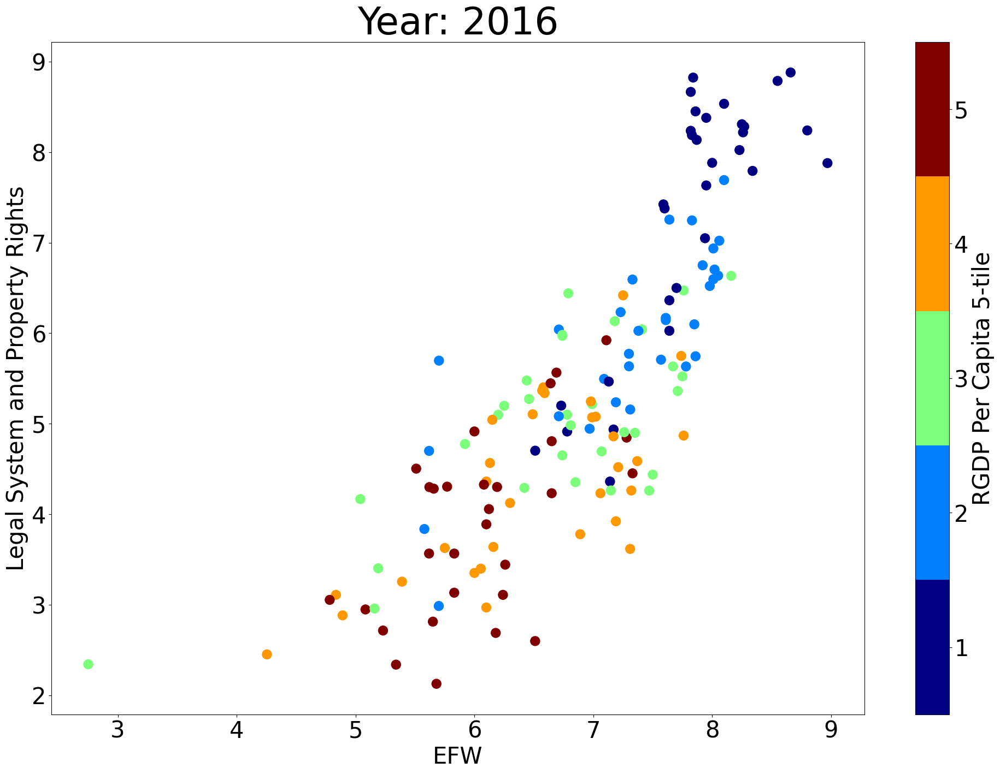

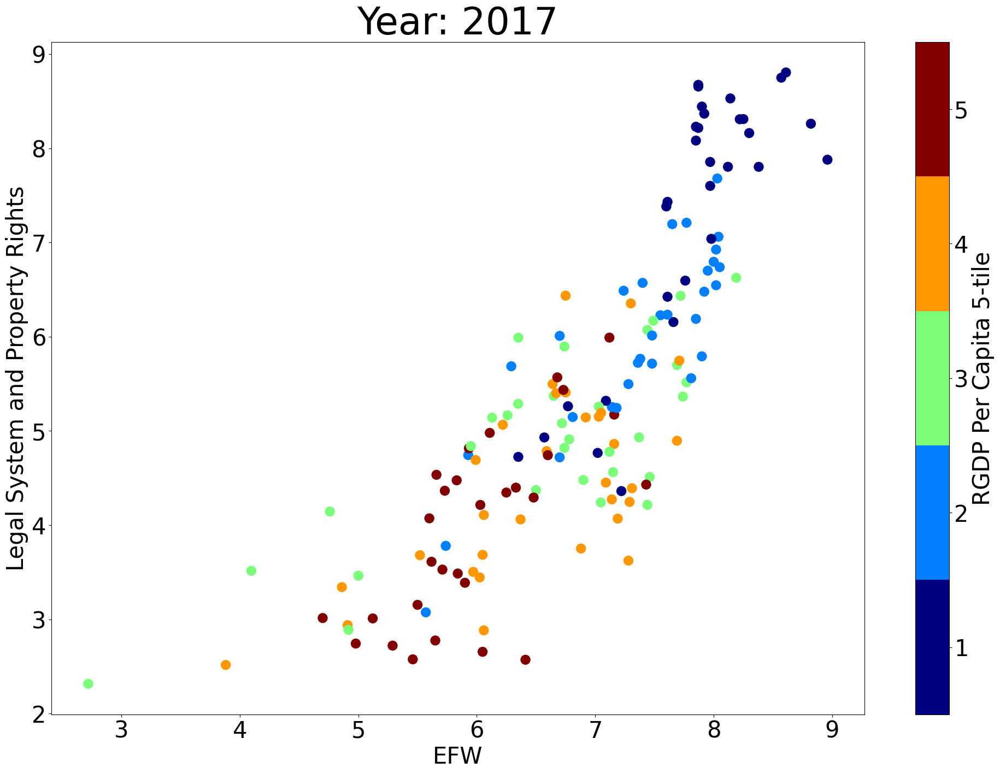

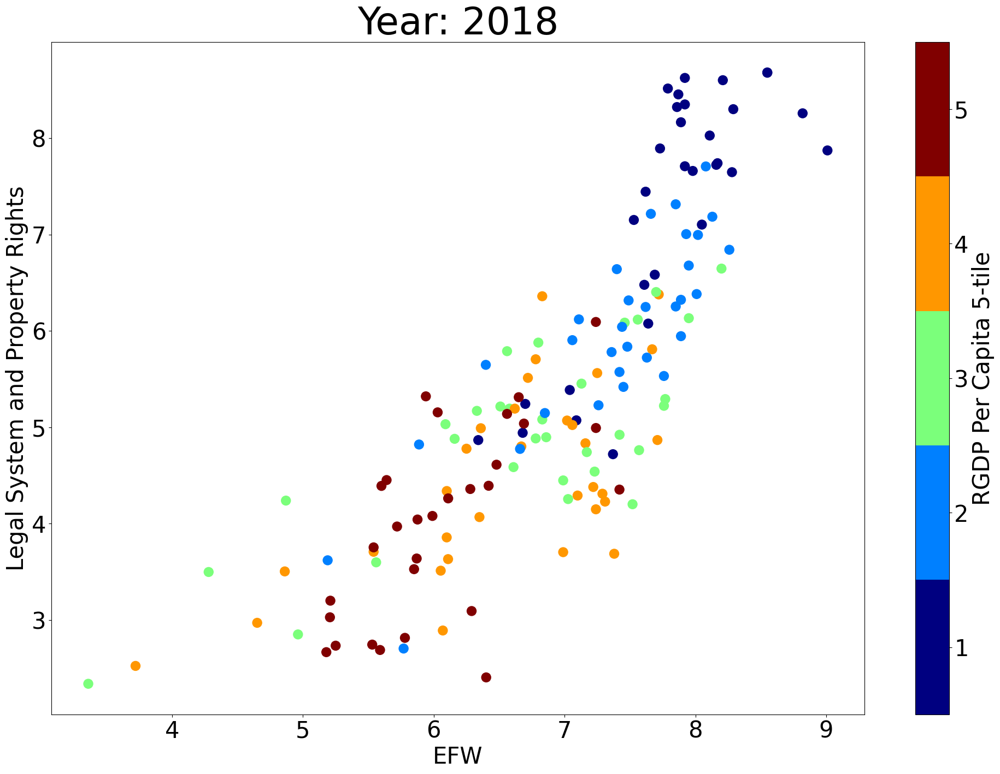

In [11]:
for year in years:
    plot_data = data[data.index.get_level_values("Year") == year]
    fig, ax = plt.subplots(figsize = (24, 16))
    # make the colors discrete
    cmap = cm.get_cmap('jet', n)

    plot_data.plot.scatter(x = "EFW", 
                           y = "Legal System and Property Rights", 
                           c = "RGDP Per Capita " + str(n) + "-tile",
                           cmap = cmap, 
                           ax = ax,
                           s = 150,
                           legend = False, 
                           vmin = 0.5, 
                           vmax = 5.5)
    ax.set_title("Year: " + str(year)[:4], fontsize = 50)

In [12]:
data[data["North America"]==1].index.get_level_values("ISO_Code_3").unique()

Index(['BHS', 'BLZ', 'BRB', 'CAN', 'CRI', 'DOM', 'GTM', 'HND', 'HTI', 'JAM',
       'MEX', 'NIC', 'PAN', 'SLV', 'TTO', 'USA'],
      dtype='object', name='ISO_Code_3')

In [15]:
import statsmodels.api as sm

X_names = ["EFW"]
y_name = ["RGDP Per Capita"]

reg_data = data.dropna()
X = reg_data[X_names]
X["Constant"] = 1
y = reg_data[y_name]
results = sm.OLS(y, X).fit()
reg_data["Residuals"] = results.resid
reg_data["Predictor"] = results.predict()

C:\Users\hthog\AppData\Local\Temp\ipykernel_5412\3014586134.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["Constant"] = 1
C:\Users\hthog\AppData\Local\Temp\ipykernel_5412\3014586134.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reg_data["Residuals"] = results.resid
C:\Users\hthog\AppData\Local\Temp\ipykernel_5412\3014586134.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats

In [16]:
reg_data

ISO_Code_2   World Bank Region  \
ISO_Code_3 Year                                        
AGO        2005-01-01         AO  Sub-Saharan Africa   
           2006-01-01         AO  Sub-Saharan Africa   
           2007-01-01         AO  Sub-Saharan Africa   
           2008-01-01         AO  Sub-Saharan Africa   
           2009-01-01         AO  Sub-Saharan Africa   
...                          ...                 ...   
ZWE        2014-01-01         ZW  Sub-Saharan Africa   
           2015-01-01         ZW  Sub-Saharan Africa   
           2016-01-01         ZW  Sub-Saharan Africa   
           2017-01-01         ZW  Sub-Saharan Africa   
           2018-01-01         ZW  Sub-Saharan Africa   

                      World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income)  \
ISO_Code_3 Year                                                                                                                                              
AGO        2005-01-01                                                 LM                                                                                     
           2006-01-01                                                 LM                                                                                     
           2007-01-01                                                 LM                                                                                     
           2008-01-01                                                 LM                                                                                     
           2009-01-01                                                 LM                                                                                     
...                                                                  ...                                                                                     
ZWE        2014-01-01                                                  L                                                                                     
           2015-01-01                                                  L                                                                                     
           2016-01-01                                                  L                                                                                     
           2017-01-01                                                  L                                                                                     
           2018-01-01                                                 LM                                                                                     

                      Countries       EFW  Size of Government  \
ISO_Code_3 Year                                                 
AGO        2005-01-01    Angola  4.214590            6.886311   
           2006-01-01    Angola  4.531179            5.162277   
           2007-01-01    Angola  4.550966            4.963676   
           2008-01-01    Angola  4.643633            4.715589   
           2009-01-01    Angola  5.251115            7.455501   
...                         ...       ...                 ...   
ZWE        2014-01-01  Zimbabwe  5.999147            6.771807   
           2015-01-01  Zimbabwe  6.449595            6.964753   
           2016-01-01  Zimbabwe  6.121996            5.332597   
           2017-01-01  Zimbabwe  5.599886            4.699843   
           2018-01-01  Zimbabwe  5.876298            5.170946   

                       Legal System and Property Rights  Sound Money  \
ISO_Code_3 Year                                                        
AGO        2005-01-01                          3.129619     1.270081   
           2006-01-01                          3.238314     3.807267   
           2007-01-01                          3.224507     4.015297   
           2008-01-01           

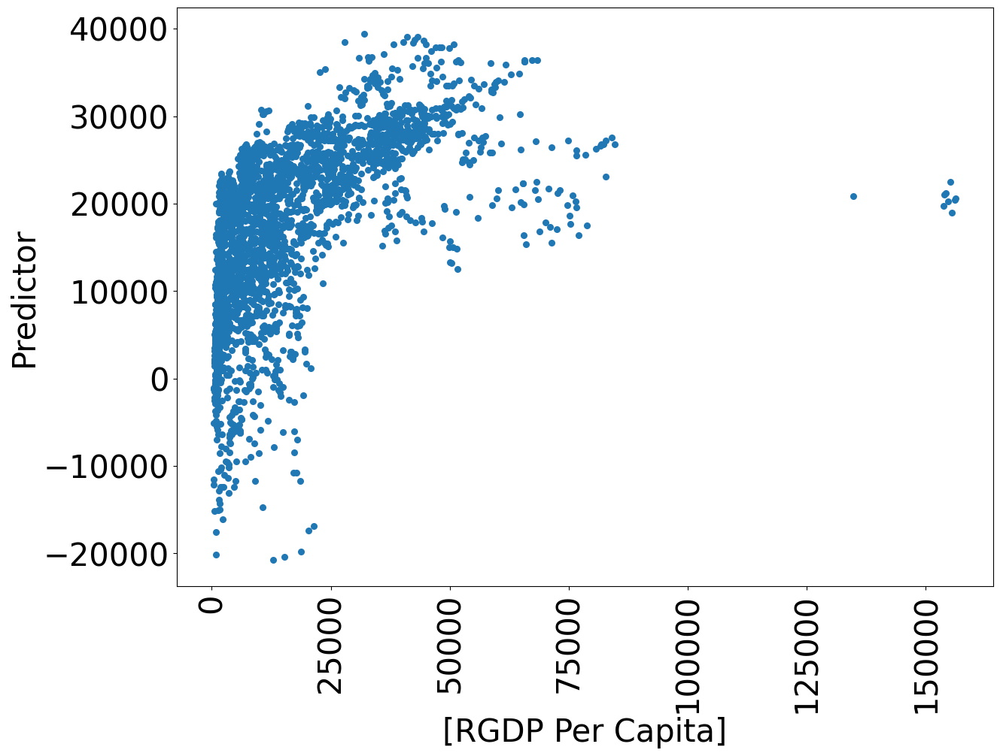

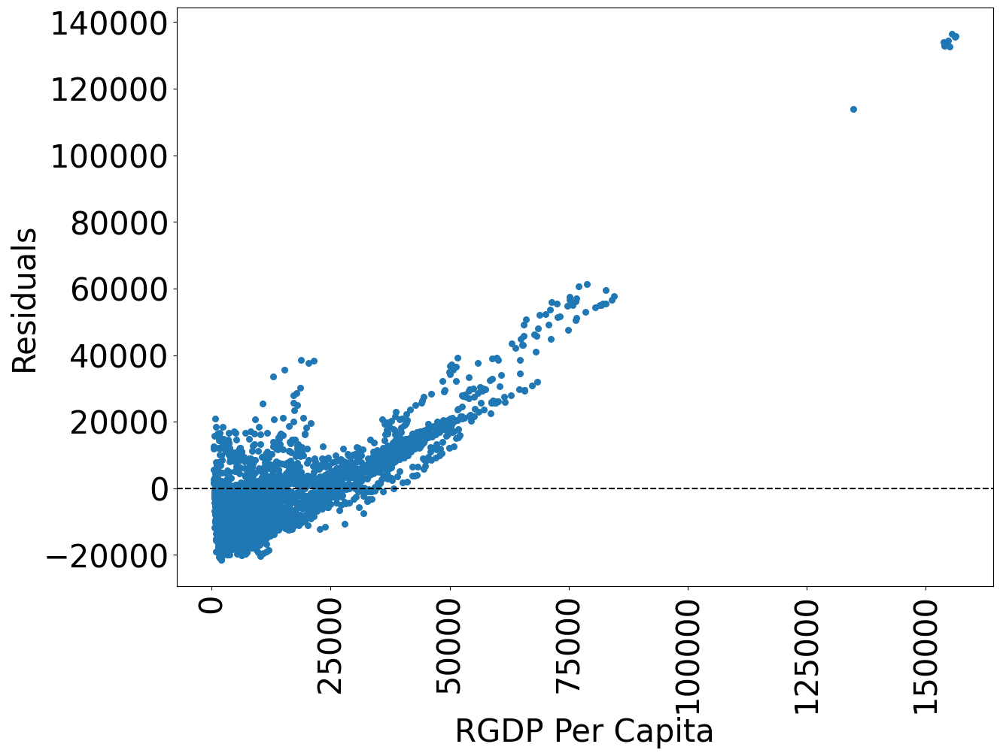

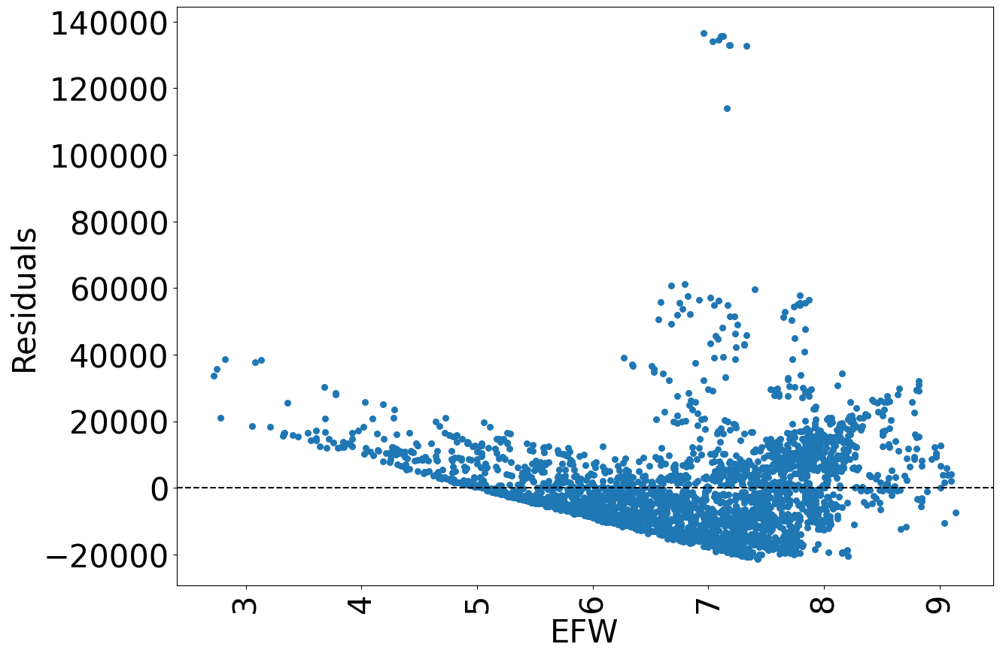

In [17]:
def plot_residuals(df, y_var, x_vars):
    fig, ax = plt.subplots(figsize = (14,10))
    df.plot.scatter(x = y_var,
                     y = "Predictor", 
                      s = 30, ax = ax)
    plt.xticks(rotation=90)
    plt.show()
    plt.close()

    for var in y_var + x_vars:
        fig, ax = plt.subplots(figsize = (14,10))
        df.plot.scatter(x = var,
                          y = "Residuals", 
                          s = 30, ax = ax)
        ax.axhline(0, ls = "--", color = "k")
        plt.xticks(rotation=90)
        plt.show()
        plt.close()
plot_residuals(reg_data, y_name, X_names)

In [21]:
def regress(data, X_names, y_name, constant = False):
    X = reg_data[X_names]
    if constant:
        X["Constant"] = 1
    y = reg_data[y_name]
    results = sm.OLS(y, X).fit()
    return results

In [22]:
results = regress(reg_data, X_names, y_name)
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:        RGDP Per Capita   R-squared (uncentered):                   0.558
Model:                            OLS   Adj. R-squared (uncentered):              0.557
Method:                 Least Squares   F-statistic:                              3537.
Date:                Tue, 25 Apr 2023   Prob (F-statistic):                        0.00
Time:                        12:09:29   Log-Likelihood:                         -31229.
No. Observations:                2808   AIC:                                  6.246e+04
Df Residuals:                    2807   BIC:                                  6.247e+04
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
EFW         2688.6007     45.206     59.474      0.000    2599.960    2777.241
==============================================================================
Omnibus:                     1814.539   Durbin-Watson:                   0.126
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            31007.890
Skew:                           2.800   Prob(JB):                         0.00
Kurtosis:                      18.286   Cond. No.                         1.00
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [23]:
results = regress(reg_data, X_names, y_name, constant=True)
results.summary()

C:\Users\hthog\AppData\Local\Temp\ipykernel_5412\1007060552.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["Constant"] = 1


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        RGDP Per Capita   R-squared:                       0.323
Model:                            OLS   Adj. R-squared:                  0.323
Method:                 Least Squares   F-statistic:                     1341.
Date:                Tue, 25 Apr 2023   Prob (F-statistic):          2.69e-240
Time:                        12:09:32   Log-Likelihood:                -30917.
No. Observations:                2808   AIC:                         6.184e+04
Df Residuals:                    2806   BIC:                         6.185e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
EFW         9371.7695    255.935     36.618      0.000    8869.930    9873.610
Constant   -4.623e+04   1748.138    -26.445      0.000   -4.97e+04   -4.28e+04
==============================================================================
Omnibus:                     2081.895   Durbin-Watson:                   0.153
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            61256.045
Skew:                           3.199   Prob(JB):                         0.00
Kurtosis:                      24.969   Cond. No.                         44.1
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [26]:
X_names = ["RGDP Per Capita 5-tile"]
results = regress(reg_data[X_names + y_name].groupby("ISO_Code_3").diff().dropna(), X_names, y_name, constant=False)
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:        RGDP Per Capita   R-squared (uncentered):                   0.134
Model:                            OLS   Adj. R-squared (uncentered):              0.133
Method:                 Least Squares   F-statistic:                              433.4
Date:                Tue, 25 Apr 2023   Prob (F-statistic):                    1.27e-89
Time:                        12:15:54   Log-Likelihood:                         -32172.
No. Observations:                2808   AIC:                                  6.435e+04
Df Residuals:                    2807   BIC:                                  6.435e+04
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
RGDP Per Capita 5-tile  2794.5764    134.243     20.817      0.000    2531.352    3057.801
==============================================================================
Omnibus:                     1053.057   Durbin-Watson:                   0.103
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             5528.543
Skew:                           1.709   Prob(JB):                         0.00
Kurtosis:                       8.964   Cond. No.                         1.00
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [27]:
!pip install linearmodels

     -------------------------------------- 988.1/988.1 kB 9.0 MB/s eta 0:00:00


In [28]:
from linearmodels import PanelOLS

def panel_regress(data, X_names, y_name, 
            constant = False,
            entity = False,
            time = False):
    X = reg_data[X_names]
    if constant:
        X["Constant"] = 1
    y = reg_data[y_name]
    results = PanelOLS(y, X, 
                       entity_effects = entity,
                       time_effects = time).fit(cov_type = "clustered", cluster_entity = True)
    return results
reg_data = data.dropna()
results  = panel_regress(reg_data, X_names, y_name,
             constant = True,
             entity = True,
             time = True)
results

C:\Users\hthog\AppData\Local\Temp\ipykernel_5412\3554147170.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["Constant"] = 1


Dep. Variable:,RGDP Per Capita,R-squared:,0.0716
Estimator:,PanelOLS,R-squared (Between):,0.3181
No. Observations:,2808,R-squared (Within):,0.0292
Date:,"Tue, Apr 25 2023",R-squared (Overall):,0.3474
Time:,12:24:29,Log-likelihood,-2.64e+04
Cov. Estimator:,Clustered,,
,,F-statistic:,203.30
Entities:,165,P-value,0.0000
Avg Obs:,17.018,Distribution:,"F(1,2635)"
Min Obs:,0.0000,,
Max Obs:,21.000,F-statistic (robust):,26.780


C:\Users\hthog\AppData\Local\Temp\ipykernel_5412\3421836895.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reg_data["Residuals"] = results.resids
C:\Users\hthog\AppData\Local\Temp\ipykernel_5412\3421836895.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reg_data["Predictor"] = results.predict()


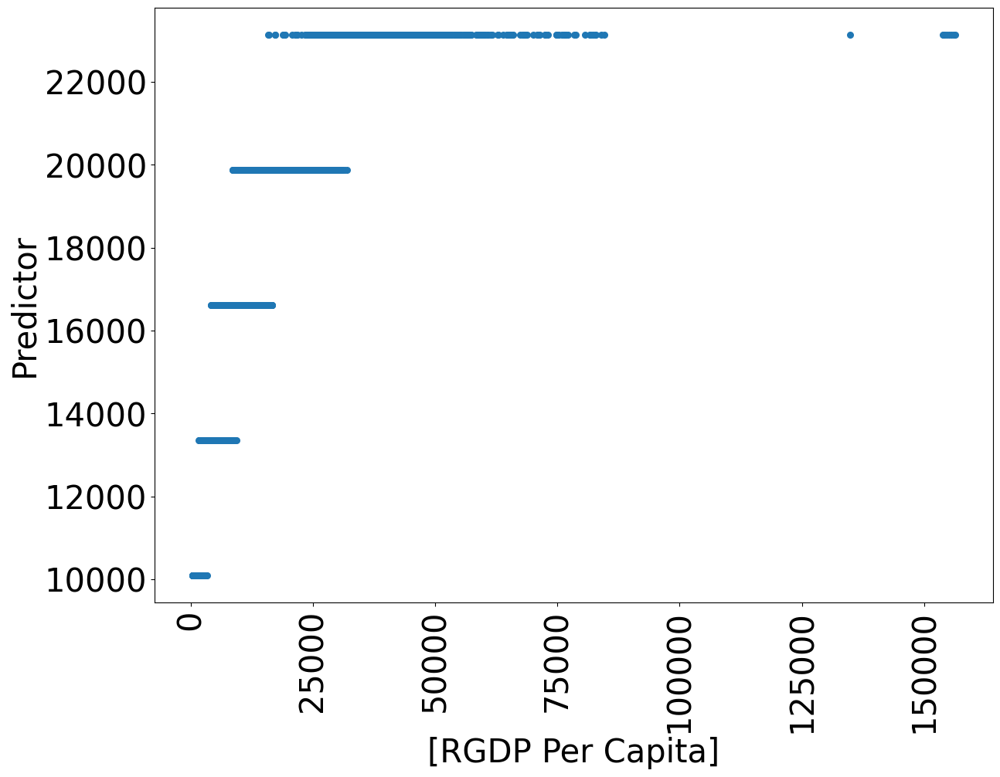

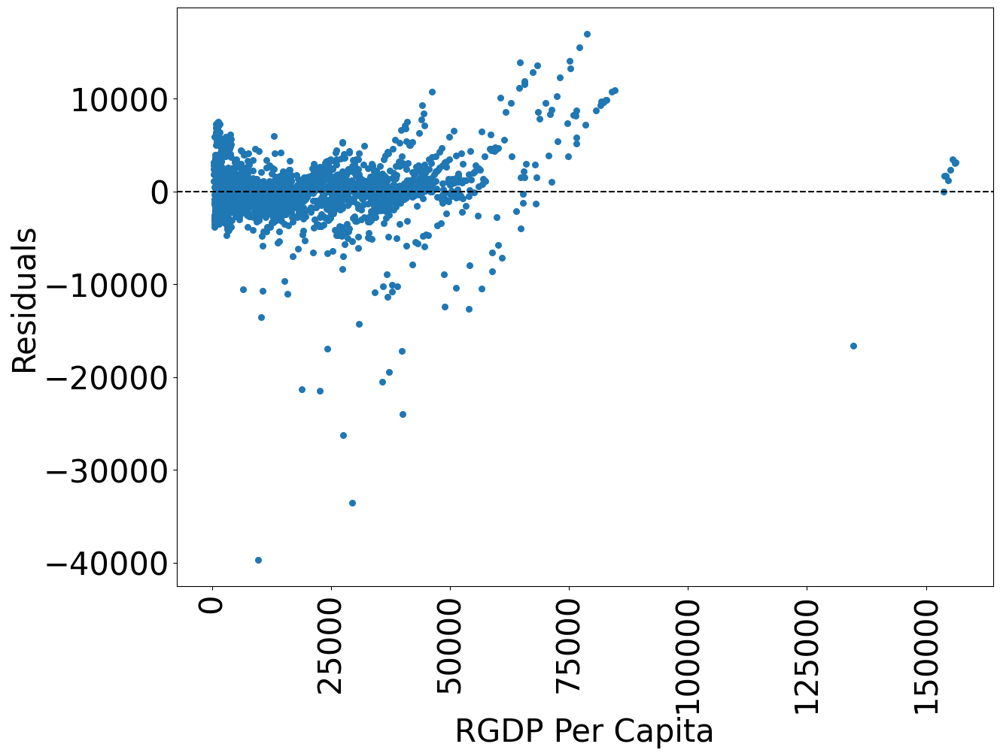

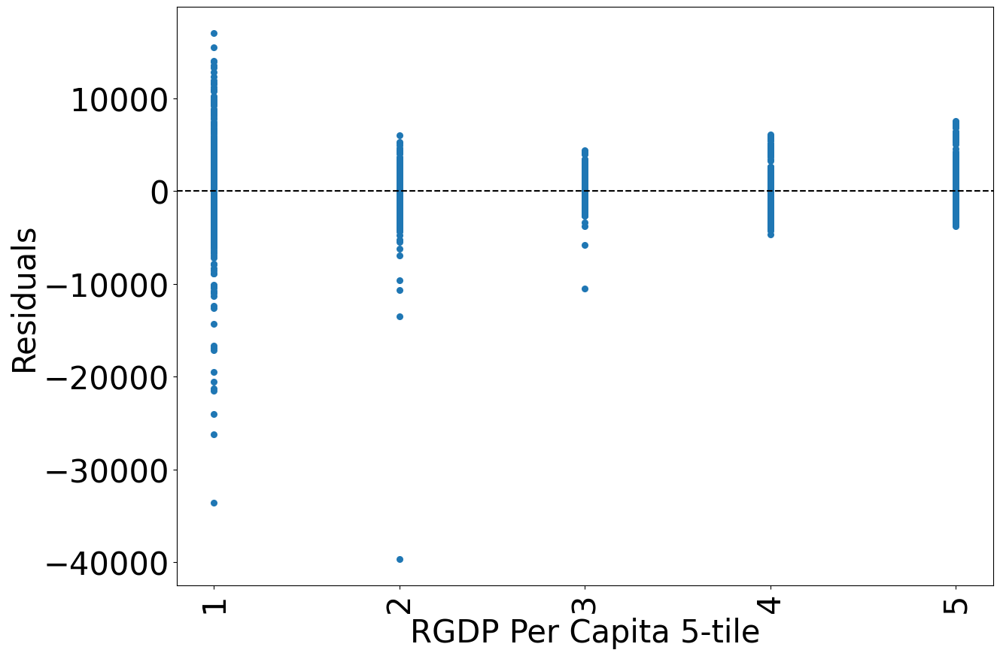

In [29]:
reg_data["Residuals"] = results.resids
reg_data["Predictor"] = results.predict()
plot_residuals(reg_data, y_name, X_names)

C:\Users\hthog\AppData\Local\Temp\ipykernel_5412\3554147170.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["Constant"] = 1
C:\Users\hthog\AppData\Local\Temp\ipykernel_5412\1592566579.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reg_data["Residuals"] = results.resids
C:\Users\hthog\AppData\Local\Temp\ipykernel_5412\1592566579.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveat

Entity: True
Time: True
                          PanelOLS Estimation Summary                           
Dep. Variable:        RGDP Per Capita   R-squared:                        0.0716
Estimator:                   PanelOLS   R-squared (Between):              0.3181
No. Observations:                2808   R-squared (Within):               0.0292
Date:                Tue, Apr 25 2023   R-squared (Overall):              0.3474
Time:                        12:35:18   Log-likelihood                 -2.64e+04
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      203.30
Entities:                         165   P-value                           0.0000
Avg Obs:                       17.018   Distribution:                  F(1,2635)
Min Obs:                       0.0000                                           
Max Obs:                       21.000   F-statistic (robust):             26.780
    

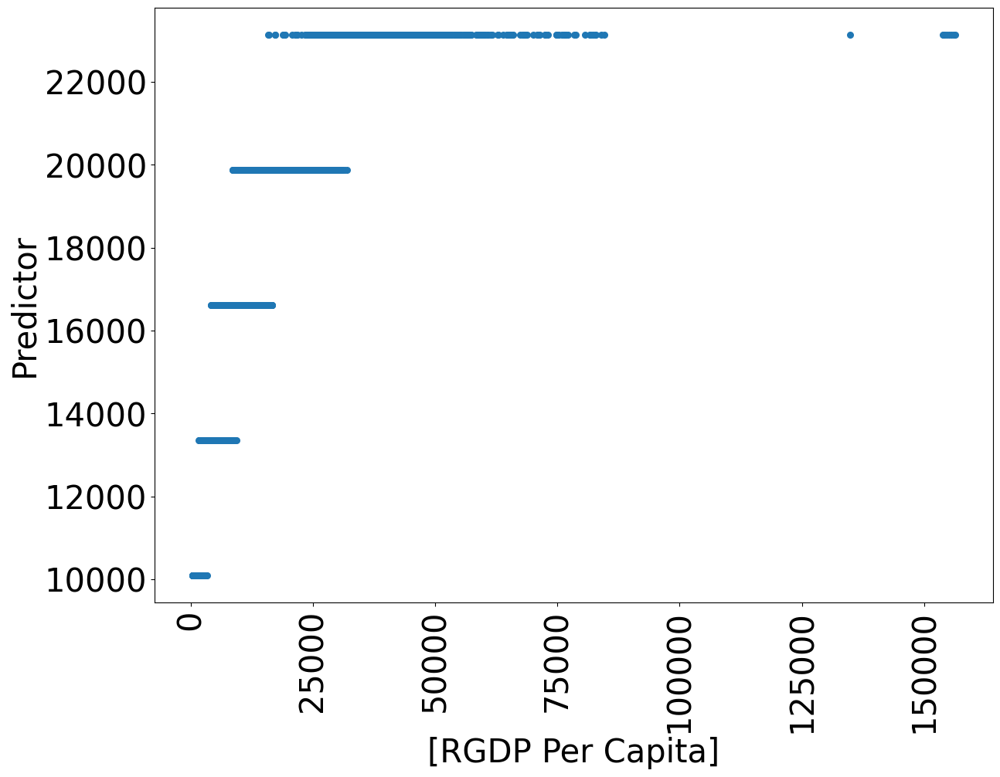

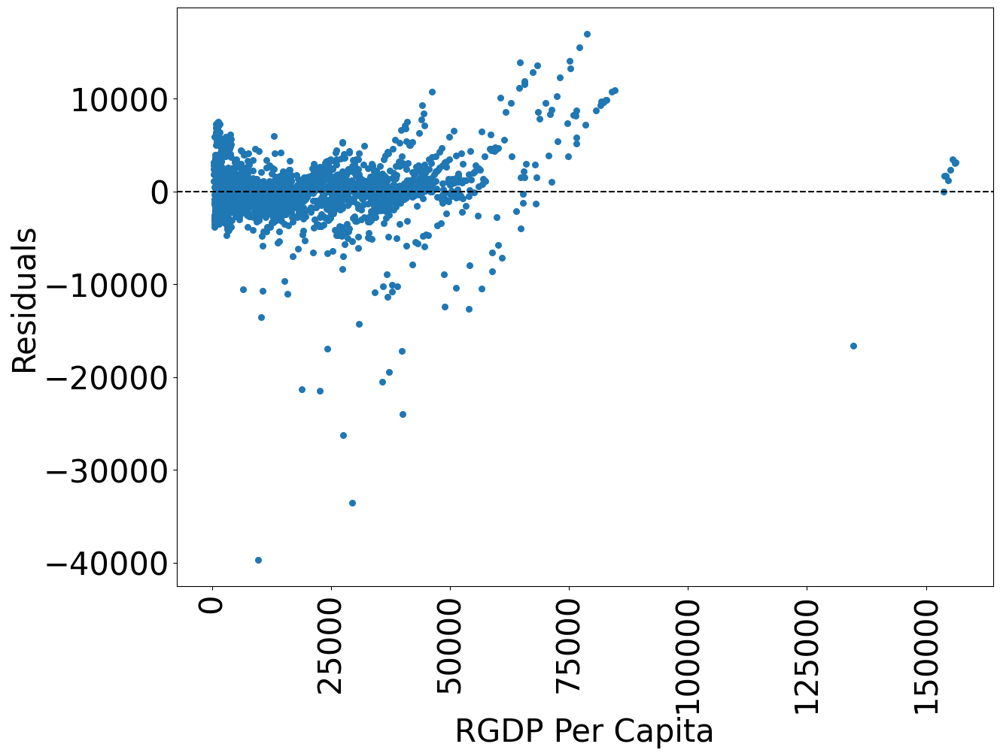

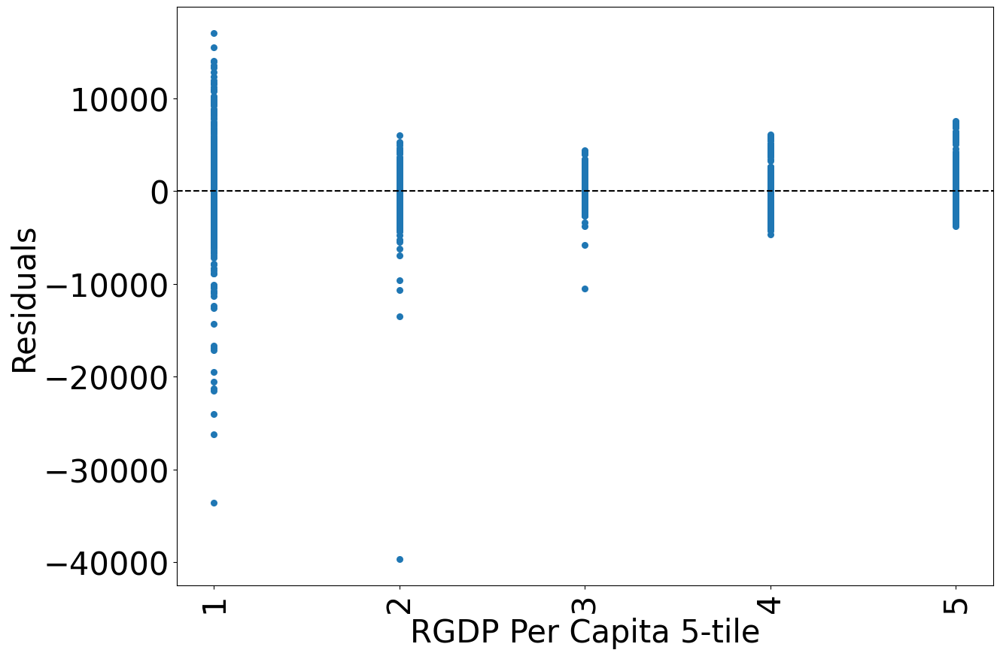

Entity: True
Time: False
                          PanelOLS Estimation Summary                           
Dep. Variable:        RGDP Per Capita   R-squared:                        0.0300
Estimator:                   PanelOLS   R-squared (Between):              0.2798
No. Observations:                2808   R-squared (Within):               0.0300
Date:                Tue, Apr 25 2023   R-squared (Overall):              0.3061
Time:                        12:35:18   Log-likelihood                -2.726e+04
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      82.077
Entities:                         165   P-value                           0.0000
Avg Obs:                       17.018   Distribution:                  F(1,2655)
Min Obs:                       0.0000                                           
Max Obs:                       21.000   F-statistic (robust):             12.060
   

C:\Users\hthog\AppData\Local\Temp\ipykernel_5412\3554147170.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["Constant"] = 1
C:\Users\hthog\AppData\Local\Temp\ipykernel_5412\1592566579.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reg_data["Residuals"] = results.resids
C:\Users\hthog\AppData\Local\Temp\ipykernel_5412\1592566579.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveat

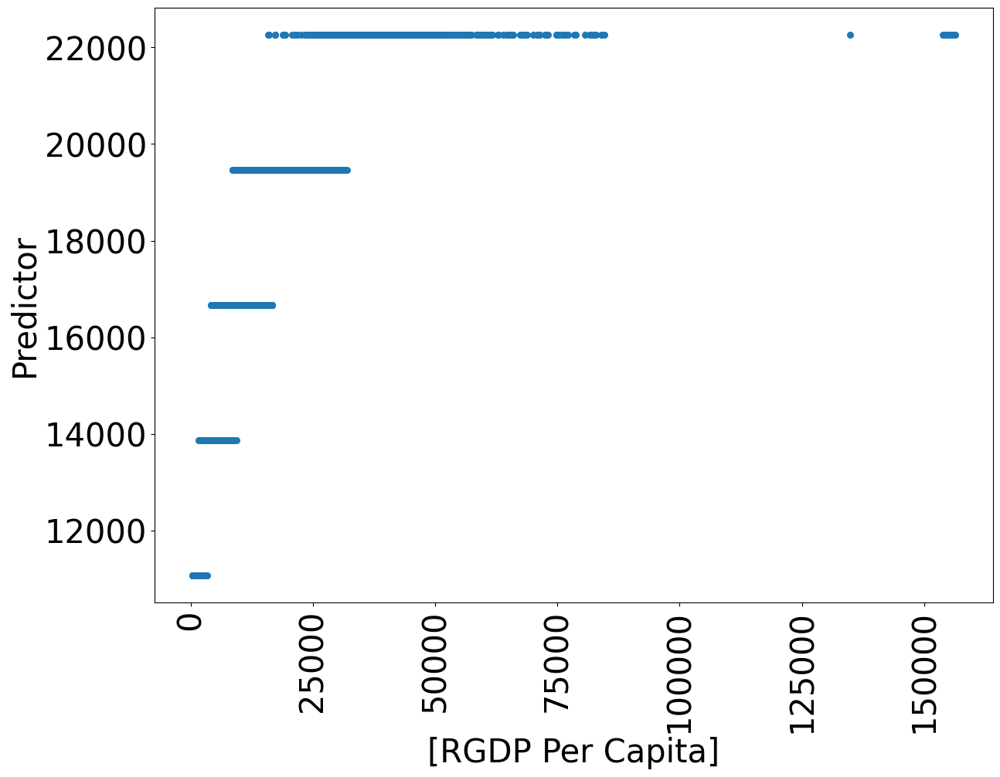

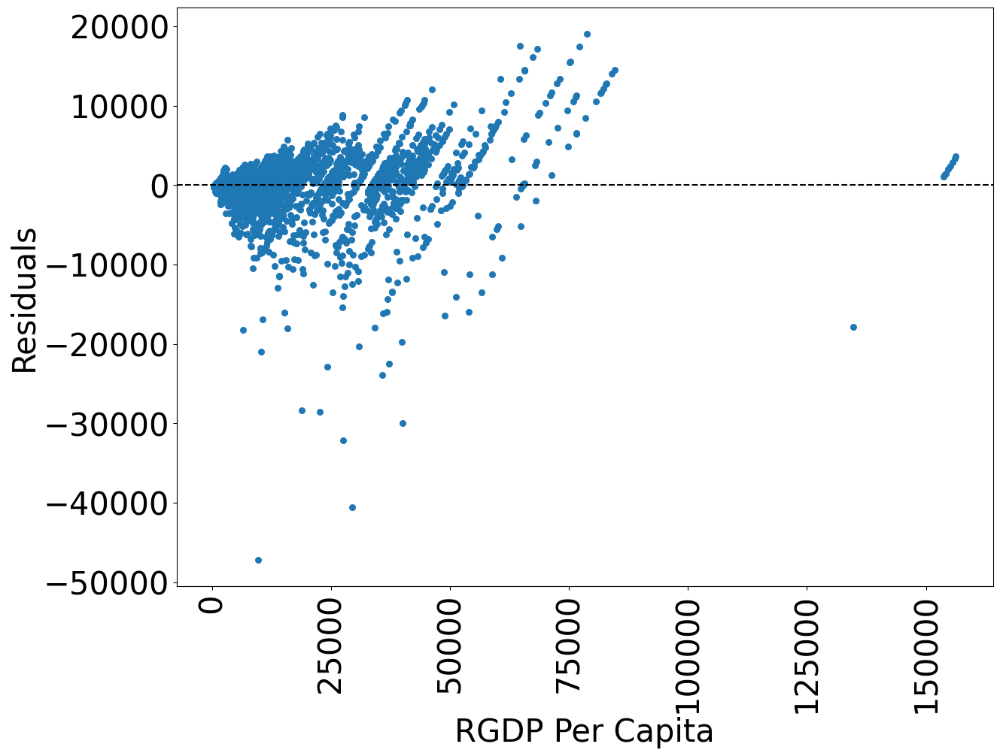

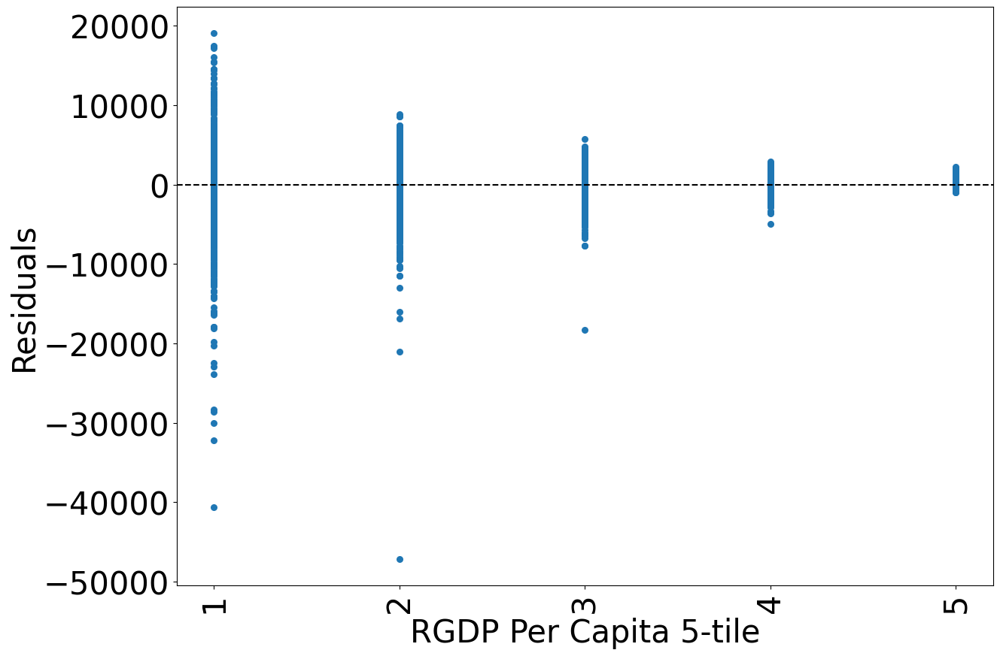

Entity: False
Time: True
                          PanelOLS Estimation Summary                           
Dep. Variable:        RGDP Per Capita   R-squared:                        0.6634
Estimator:                   PanelOLS   R-squared (Between):              0.6083
No. Observations:                2808   R-squared (Within):              -0.1795
Date:                Tue, Apr 25 2023   R-squared (Overall):              0.6382
Time:                        12:35:19   Log-likelihood                -2.992e+04
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      5492.0
Entities:                         165   P-value                           0.0000
Avg Obs:                       17.018   Distribution:                  F(1,2786)
Min Obs:                       0.0000                                           
Max Obs:                       21.000   F-statistic (robust):             267.58
   

C:\Users\hthog\AppData\Local\Temp\ipykernel_5412\3554147170.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["Constant"] = 1
C:\Users\hthog\AppData\Local\Temp\ipykernel_5412\1592566579.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reg_data["Residuals"] = results.resids
C:\Users\hthog\AppData\Local\Temp\ipykernel_5412\1592566579.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveat

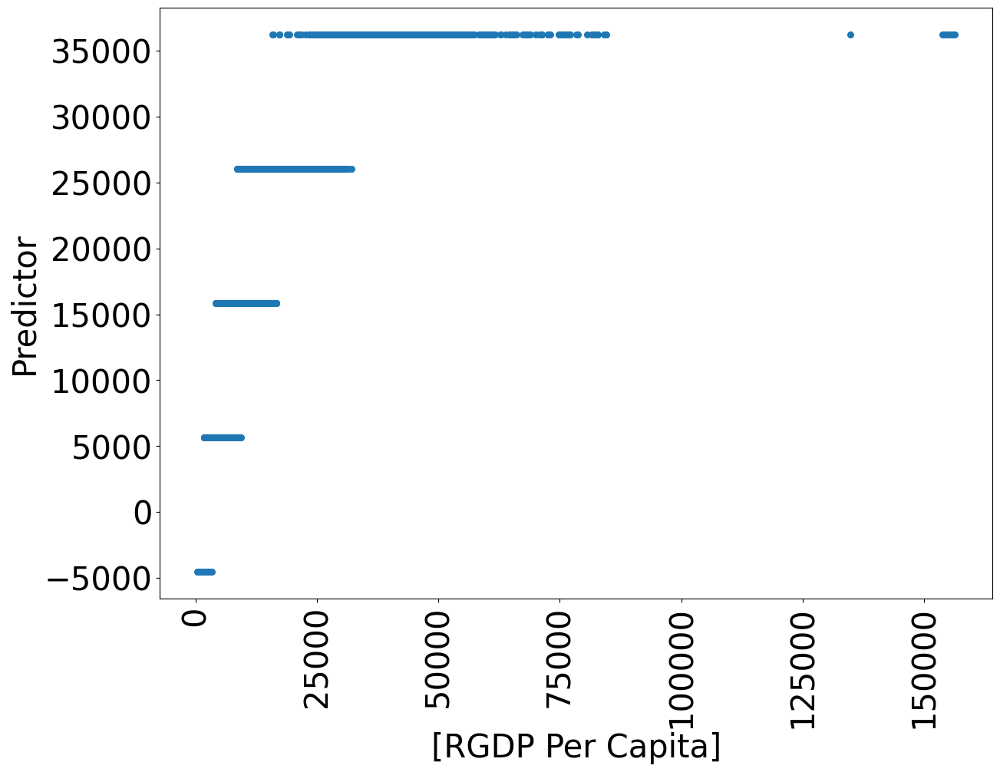

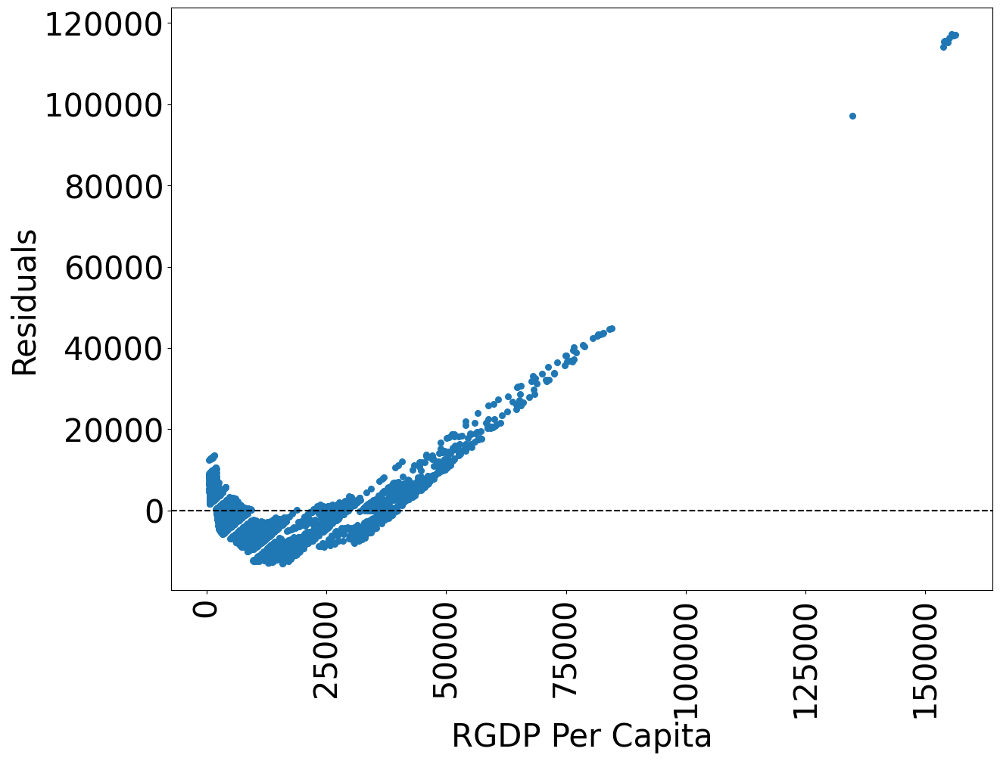

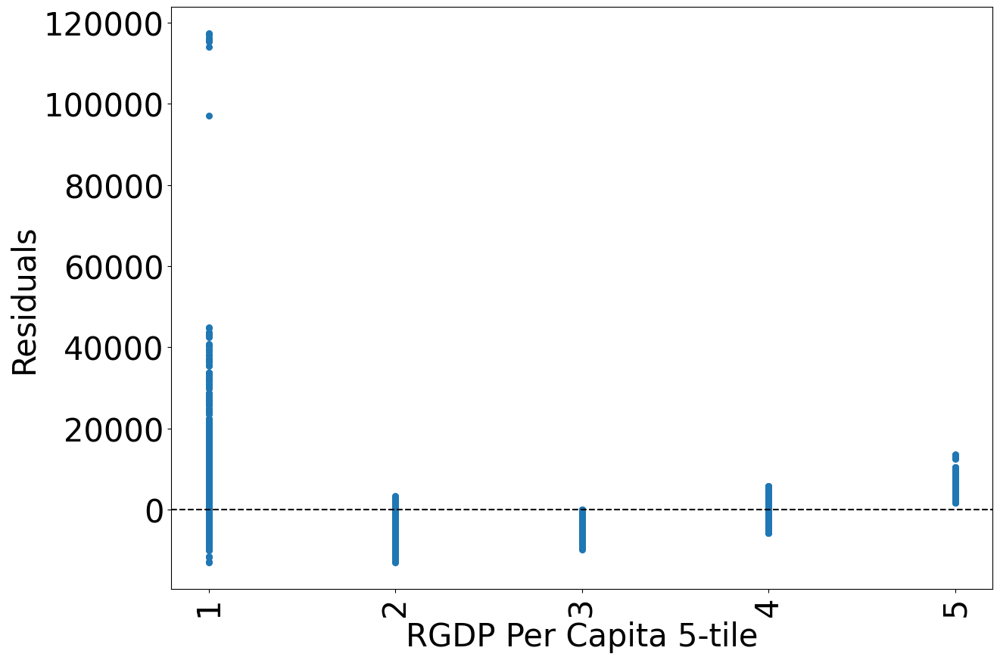

Entity: False
Time: False
                          PanelOLS Estimation Summary                           
Dep. Variable:        RGDP Per Capita   R-squared:                        0.6383
Estimator:                   PanelOLS   R-squared (Between):              0.6076
No. Observations:                2808   R-squared (Within):              -0.1712
Date:                Tue, Apr 25 2023   R-squared (Overall):              0.6383
Time:                        12:35:19   Log-likelihood                -3.004e+04
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      4951.8
Entities:                         165   P-value                           0.0000
Avg Obs:                       17.018   Distribution:                  F(1,2806)
Min Obs:                       0.0000                                           
Max Obs:                       21.000   F-statistic (robust):             272.40
  

C:\Users\hthog\AppData\Local\Temp\ipykernel_5412\3554147170.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["Constant"] = 1
C:\Users\hthog\AppData\Local\Temp\ipykernel_5412\1592566579.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reg_data["Residuals"] = results.resids
C:\Users\hthog\AppData\Local\Temp\ipykernel_5412\1592566579.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveat

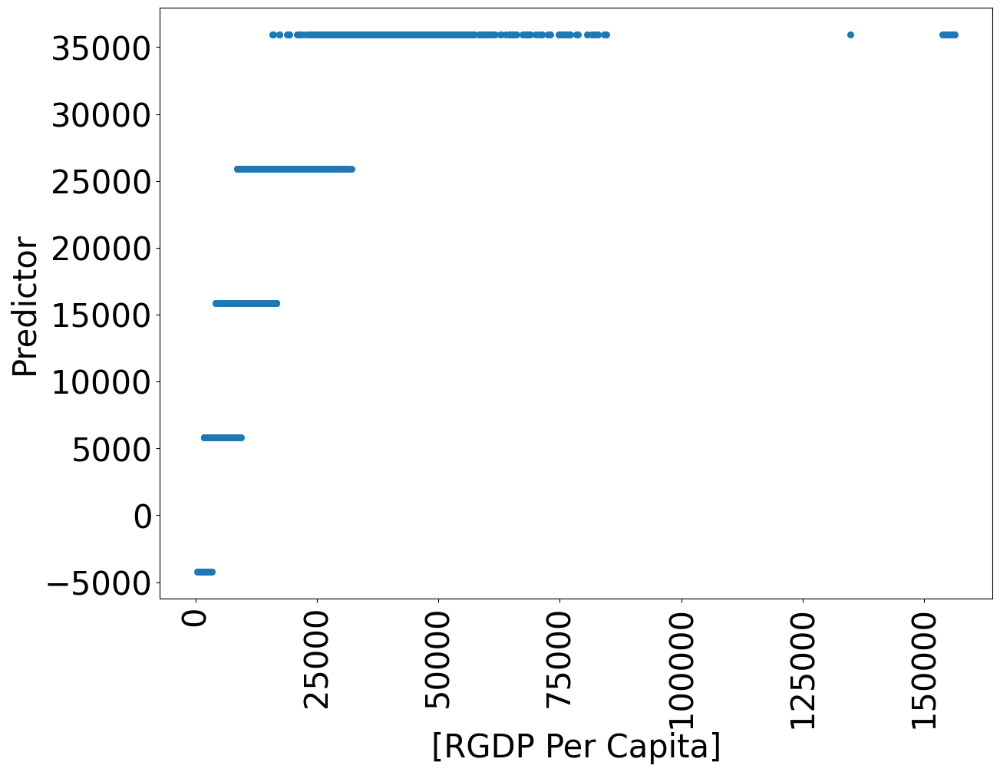

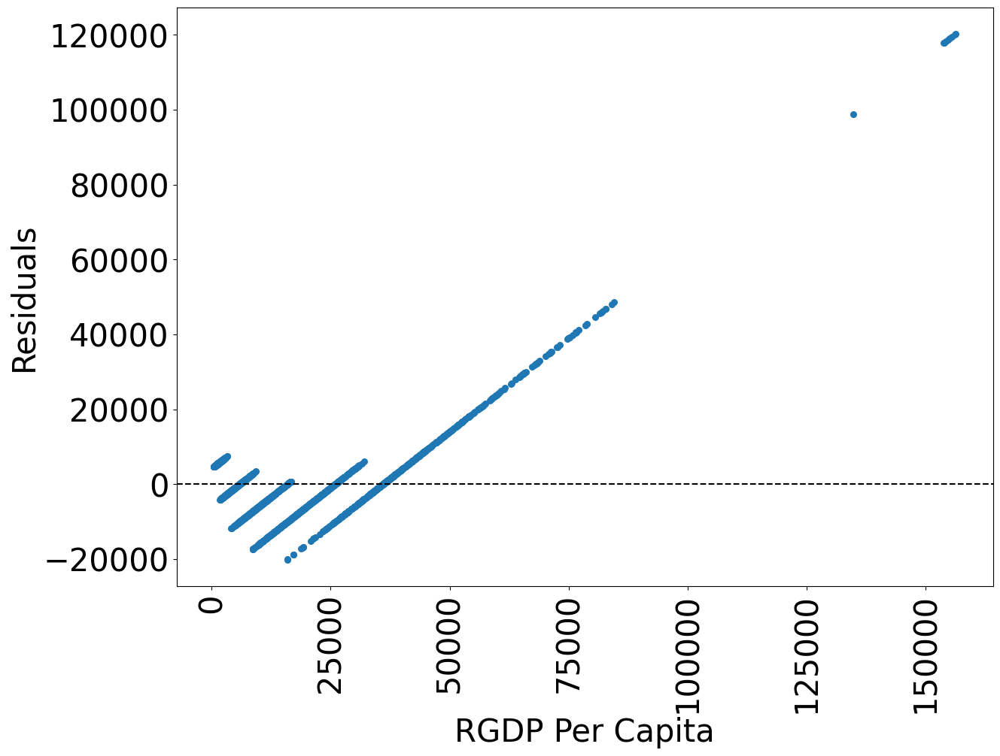

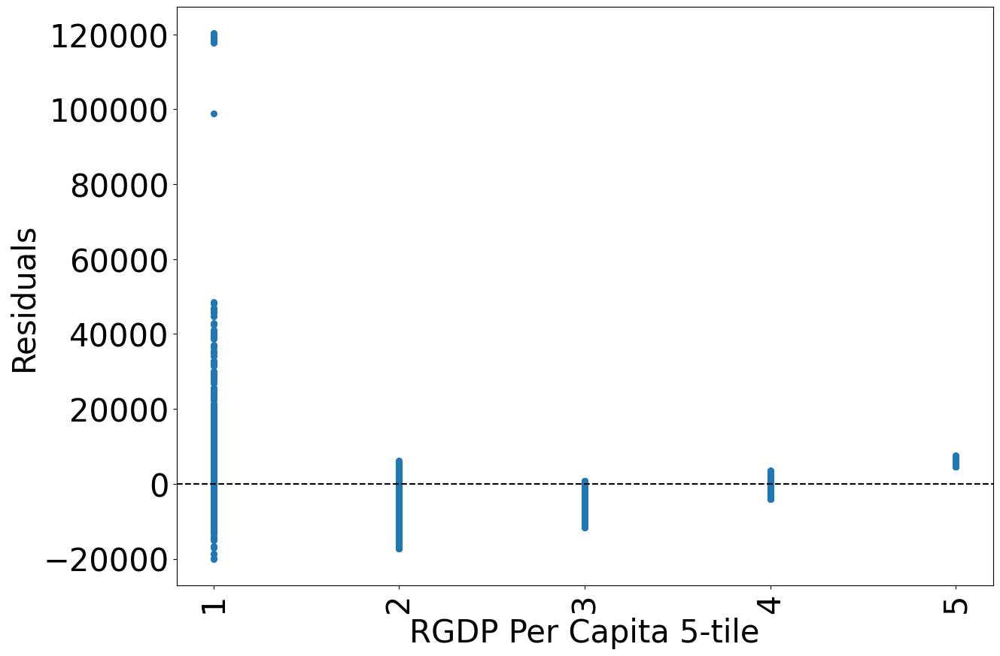

In [31]:
for entity in [True, False]:
    for time in [True, False]:
        results  = panel_regress(reg_data, X_names, y_name,
             constant = True,
             entity = entity,
             time = time)
        print("Entity: " + str(entity))
        print("Time: " + str(time))
        print(results)
        reg_data["Residuals"] = results.resids
        reg_data["Predictor"] = results.predict()
        plot_residuals(reg_data, y_name, X_names)

C:\Users\hthog\AppData\Local\Temp\ipykernel_5412\3554147170.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["Constant"] = 1
C:\Users\hthog\AppData\Local\Temp\ipykernel_5412\176663271.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reg_data["Residuals"] = results.resids
C:\Users\hthog\AppData\Local\Temp\ipykernel_5412\176663271.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats 

Entity: True
Time: True
                          PanelOLS Estimation Summary                           
Dep. Variable:        RGDP Per Capita   R-squared:                        0.0383
Estimator:                   PanelOLS   R-squared (Between):             -0.0812
No. Observations:                2808   R-squared (Within):              -0.0212
Date:                Tue, Apr 25 2023   R-squared (Overall):             -0.0909
Time:                        12:44:18   Log-likelihood                -2.645e+04
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      20.954
Entities:                         165   P-value                           0.0000
Avg Obs:                       17.018   Distribution:                  F(5,2631)
Min Obs:                       0.0000                                           
Max Obs:                       21.000   F-statistic (robust):             3.3410
    

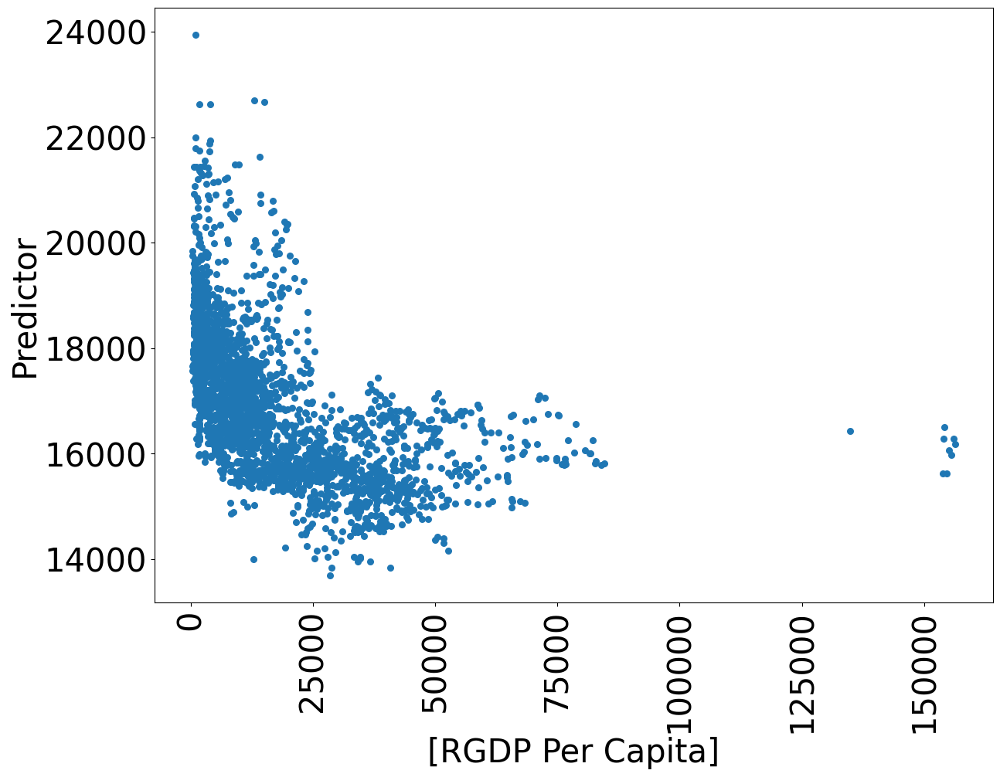

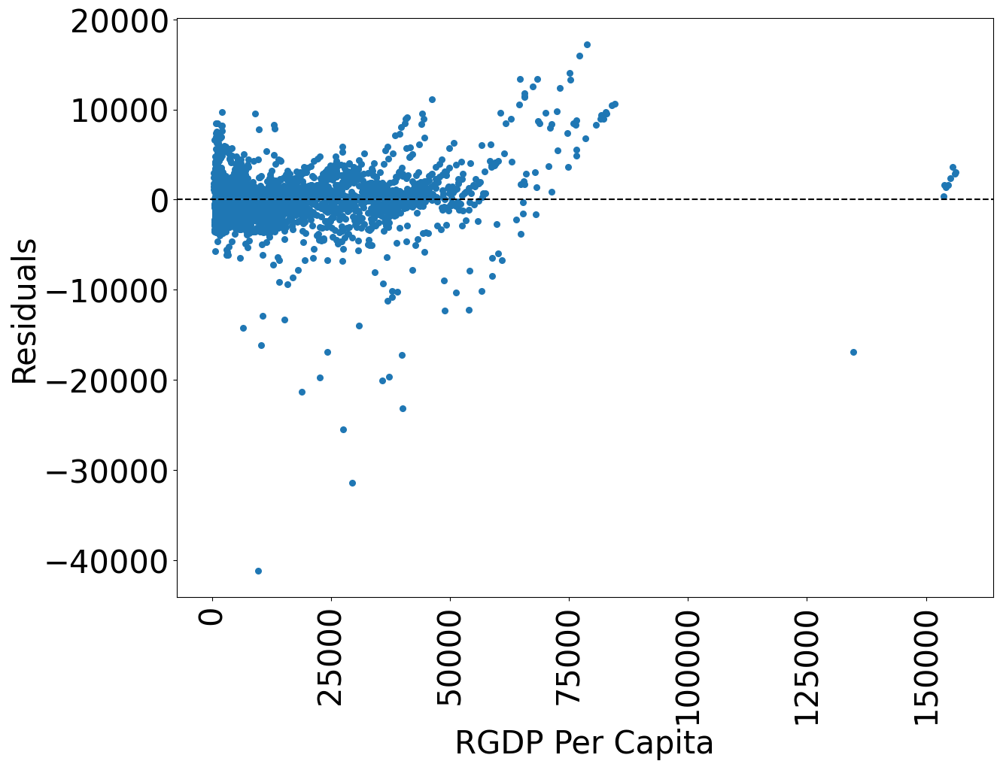

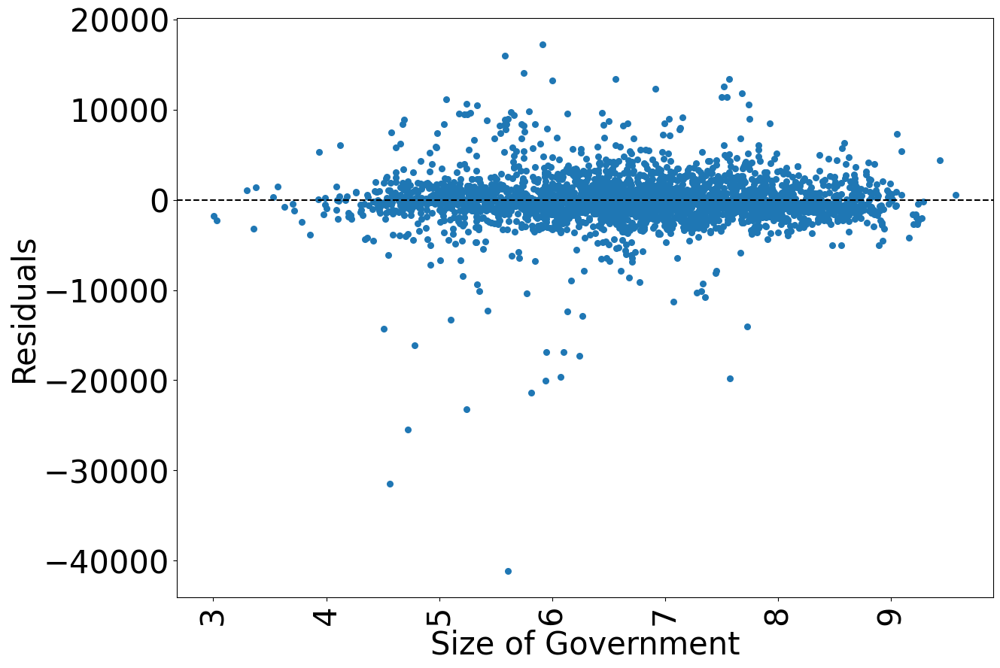

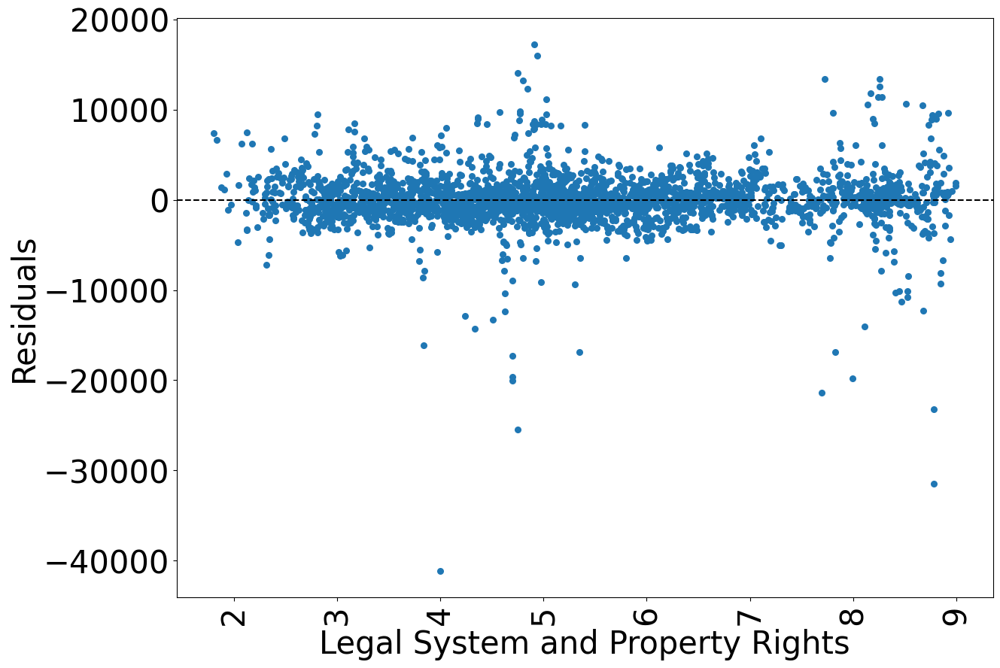

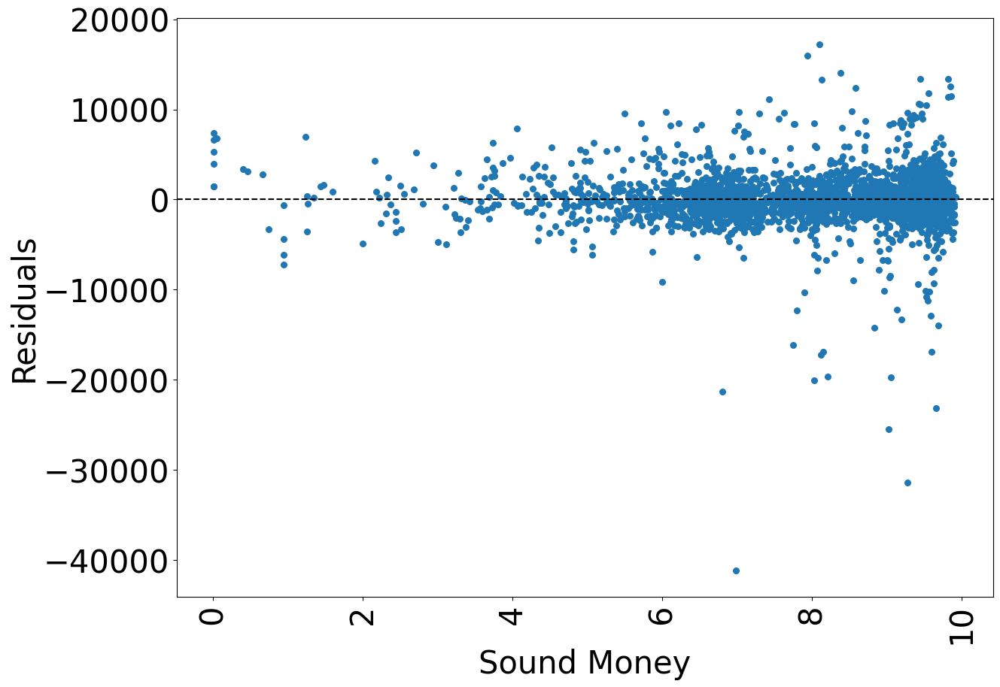

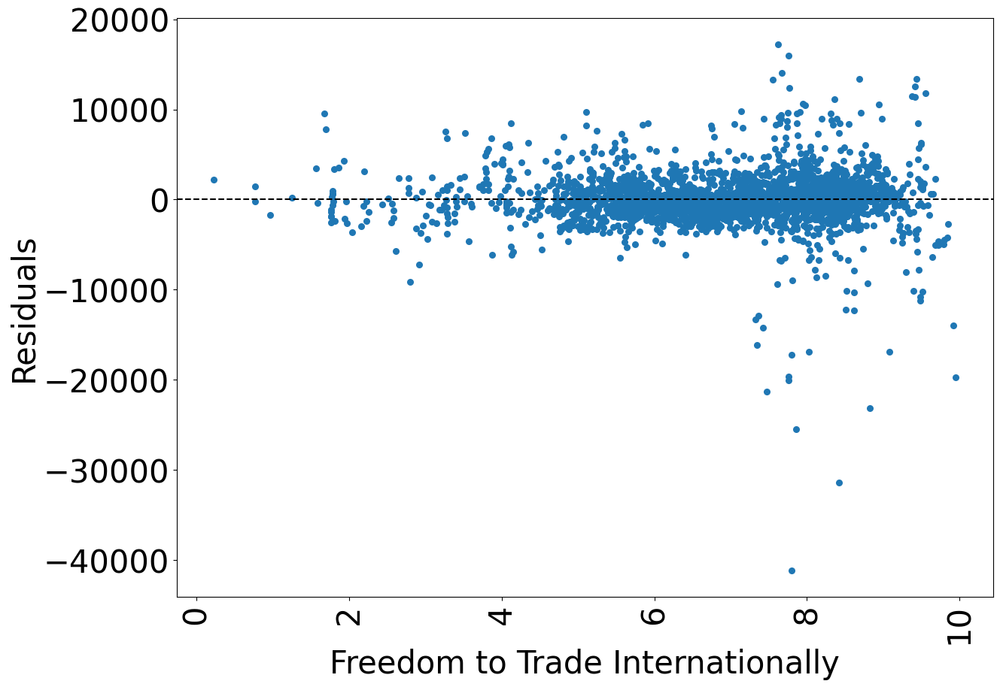

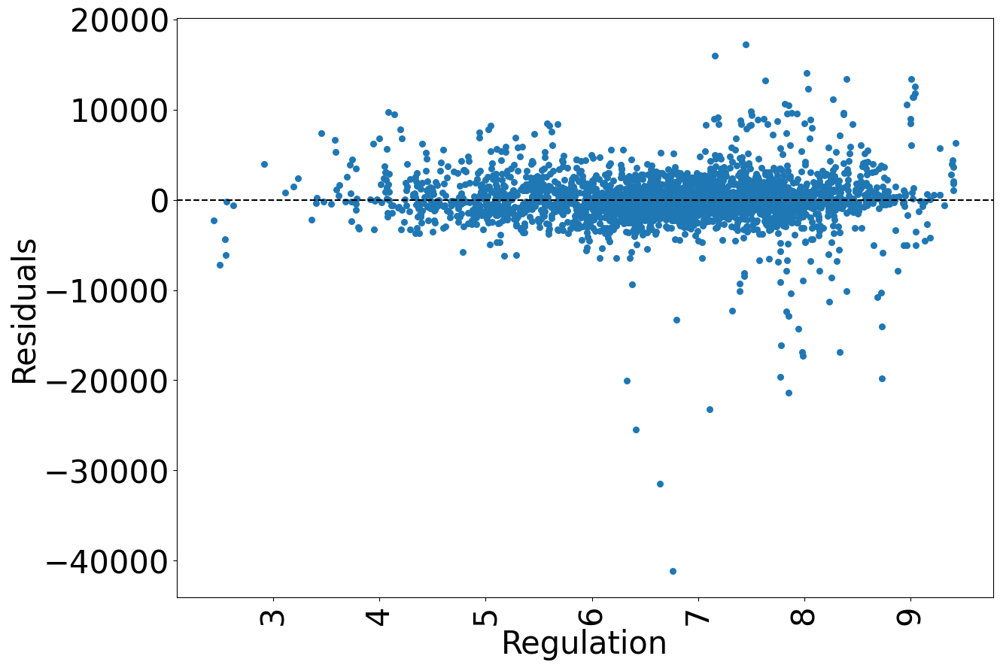

C:\Users\hthog\AppData\Local\Temp\ipykernel_5412\3554147170.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["Constant"] = 1
C:\Users\hthog\AppData\Local\Temp\ipykernel_5412\176663271.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reg_data["Residuals"] = results.resids
C:\Users\hthog\AppData\Local\Temp\ipykernel_5412\176663271.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats 

Entity: True
Time: False
                          PanelOLS Estimation Summary                           
Dep. Variable:        RGDP Per Capita   R-squared:                        0.1682
Estimator:                   PanelOLS   R-squared (Between):              0.2259
No. Observations:                2808   R-squared (Within):               0.1682
Date:                Tue, Apr 25 2023   R-squared (Overall):              0.2747
Time:                        12:44:19   Log-likelihood                -2.705e+04
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      107.24
Entities:                         165   P-value                           0.0000
Avg Obs:                       17.018   Distribution:                  F(5,2651)
Min Obs:                       0.0000                                           
Max Obs:                       21.000   F-statistic (robust):             19.238
   

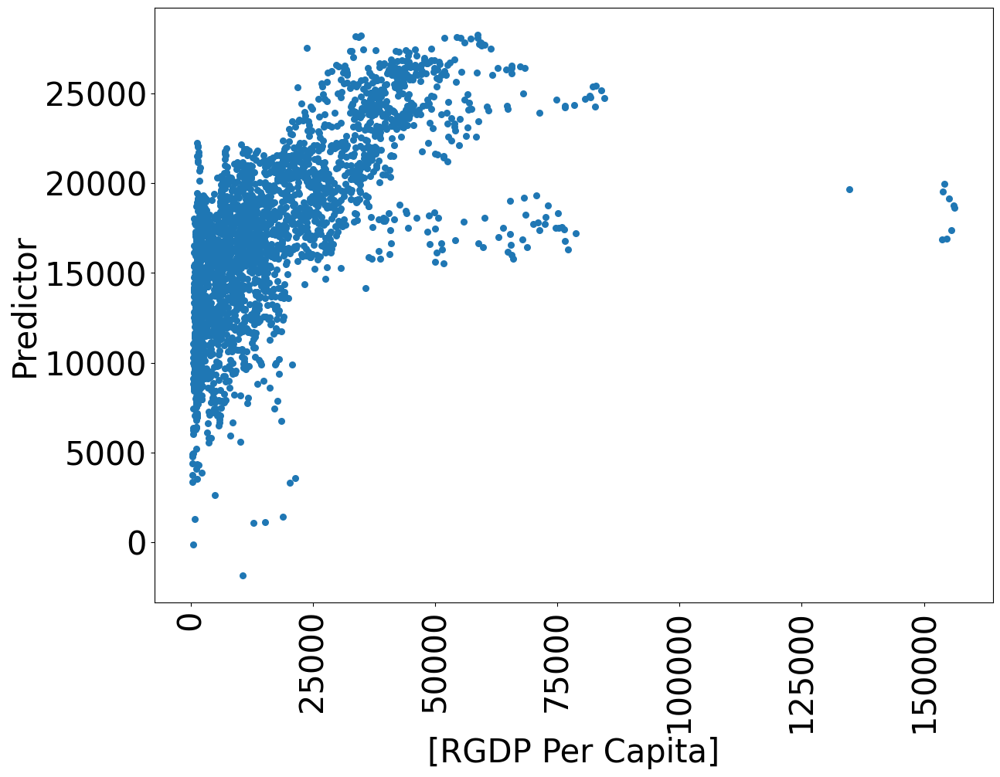

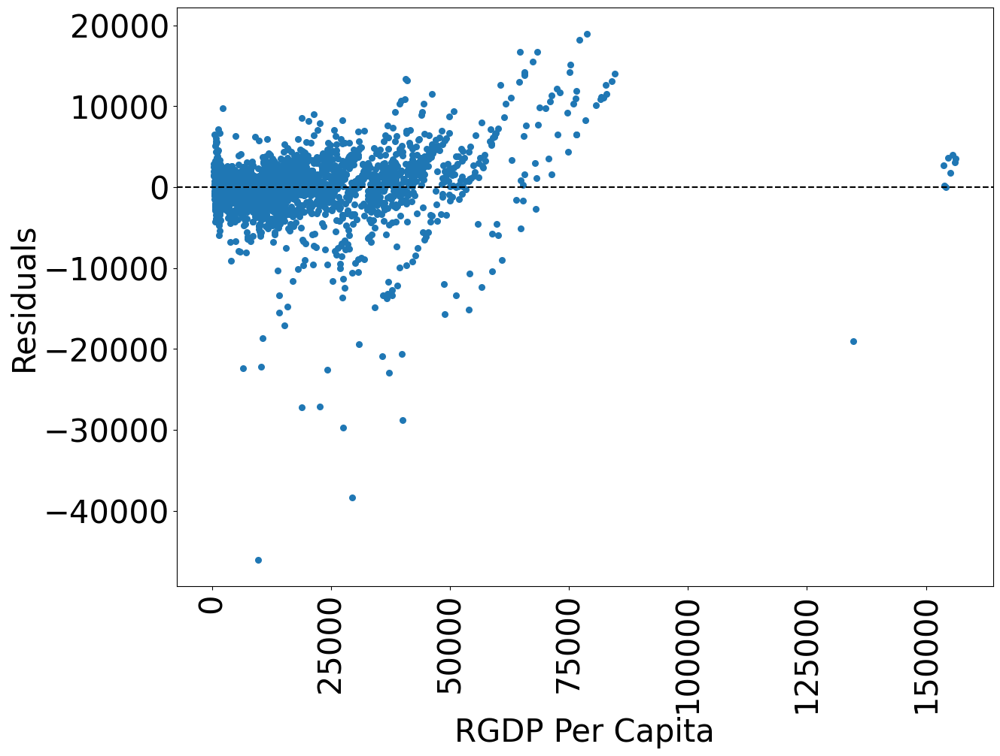

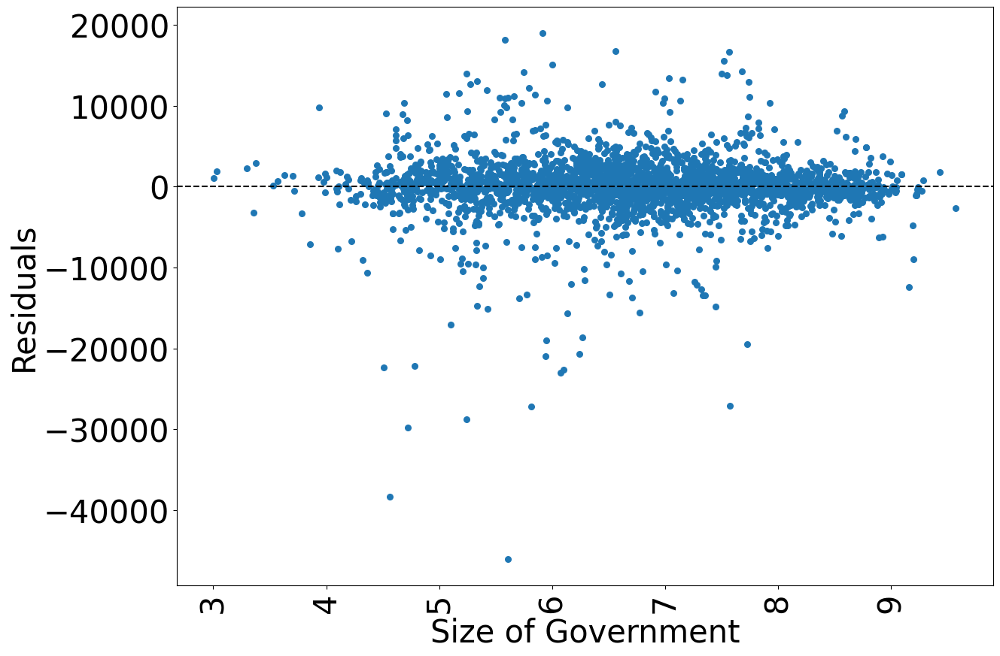

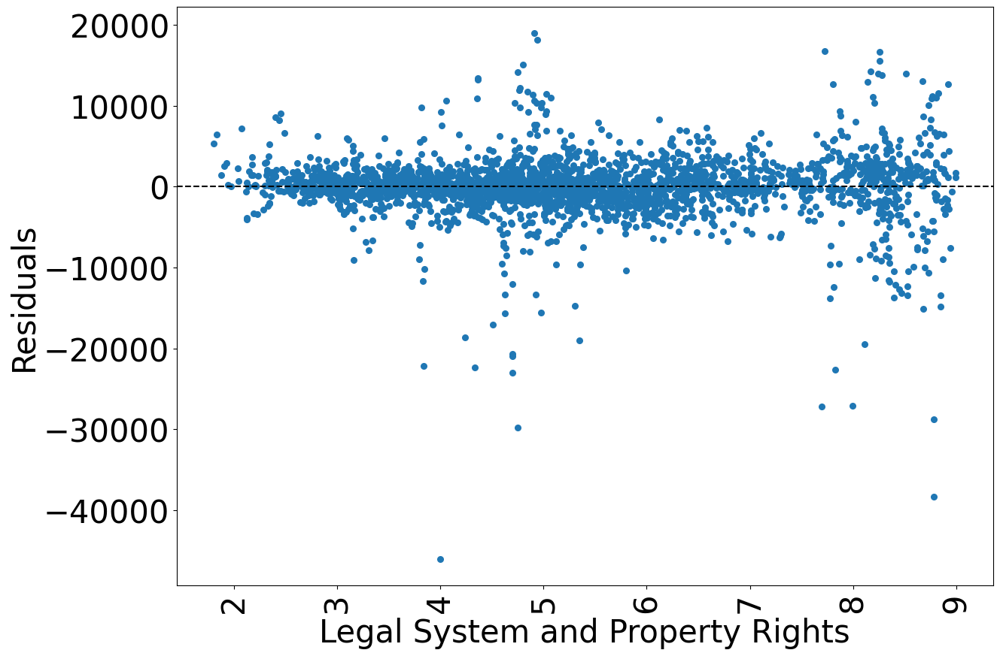

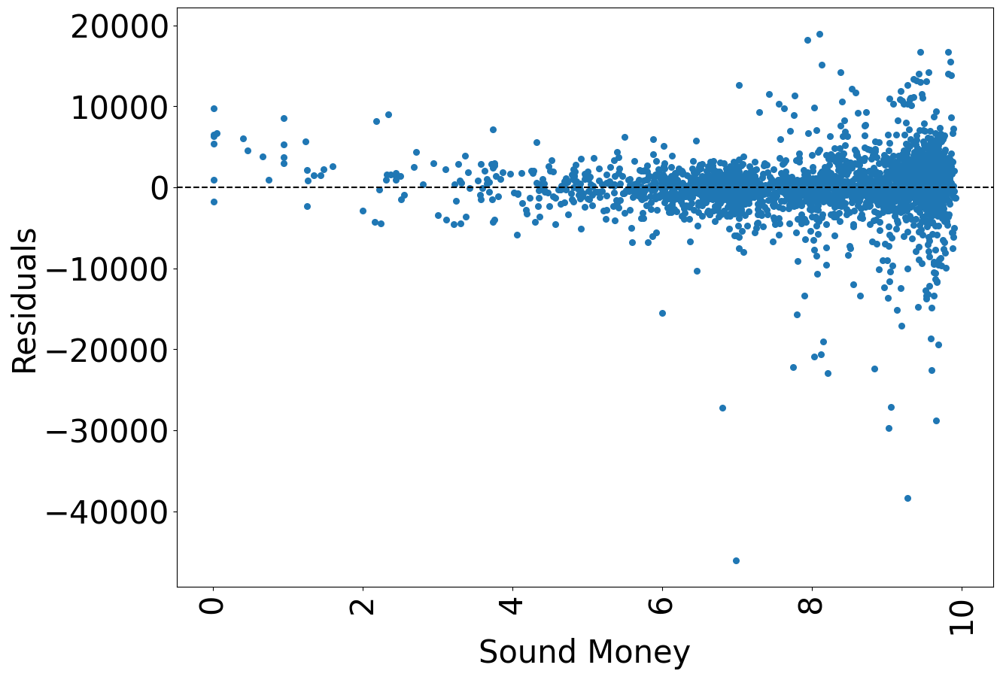

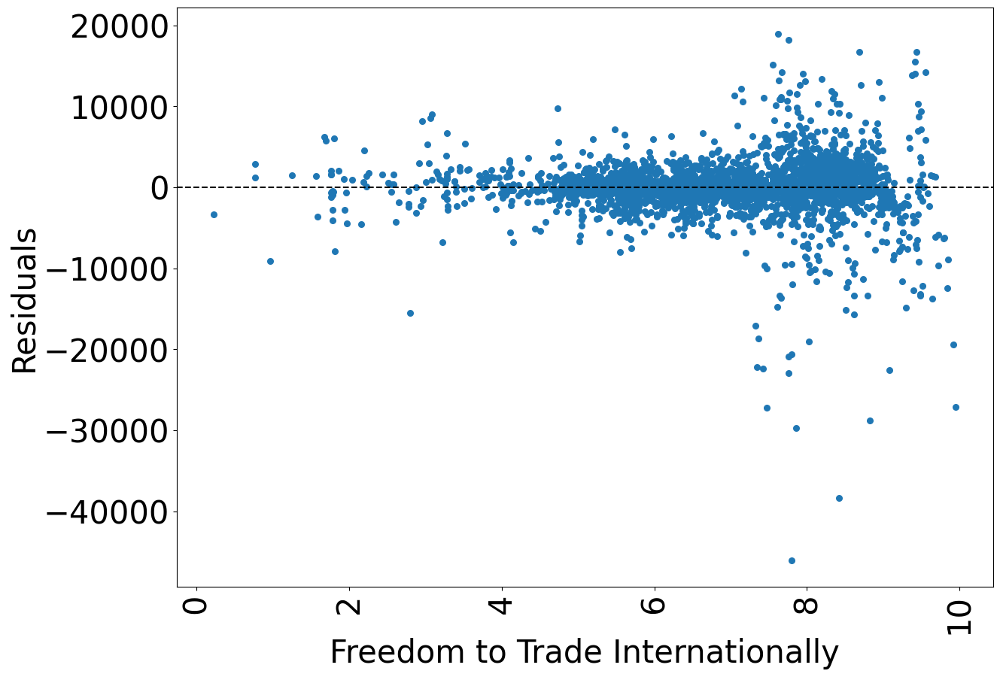

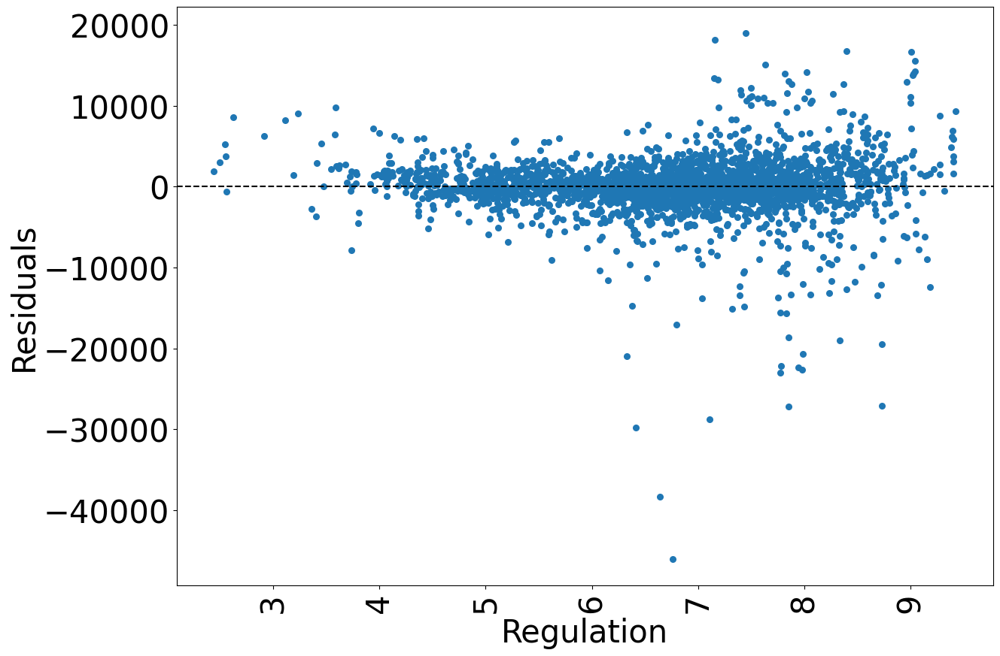

Entity: False
Time: True
                          PanelOLS Estimation Summary                           
Dep. Variable:        RGDP Per Capita   R-squared:                        0.5004
Estimator:                   PanelOLS   R-squared (Between):              0.4389
No. Observations:                2808   R-squared (Within):              -0.1565
Date:                Tue, Apr 25 2023   R-squared (Overall):              0.5013
Time:                        12:44:20   Log-likelihood                -3.047e+04
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      557.19
Entities:                         165   P-value                           0.0000
Avg Obs:                       17.018   Distribution:                  F(5,2782)
Min Obs:                       0.0000                                           
Max Obs:                       21.000   F-statistic (robust):             60.154
   

C:\Users\hthog\AppData\Local\Temp\ipykernel_5412\3554147170.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["Constant"] = 1
C:\Users\hthog\AppData\Local\Temp\ipykernel_5412\176663271.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reg_data["Residuals"] = results.resids
C:\Users\hthog\AppData\Local\Temp\ipykernel_5412\176663271.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats 

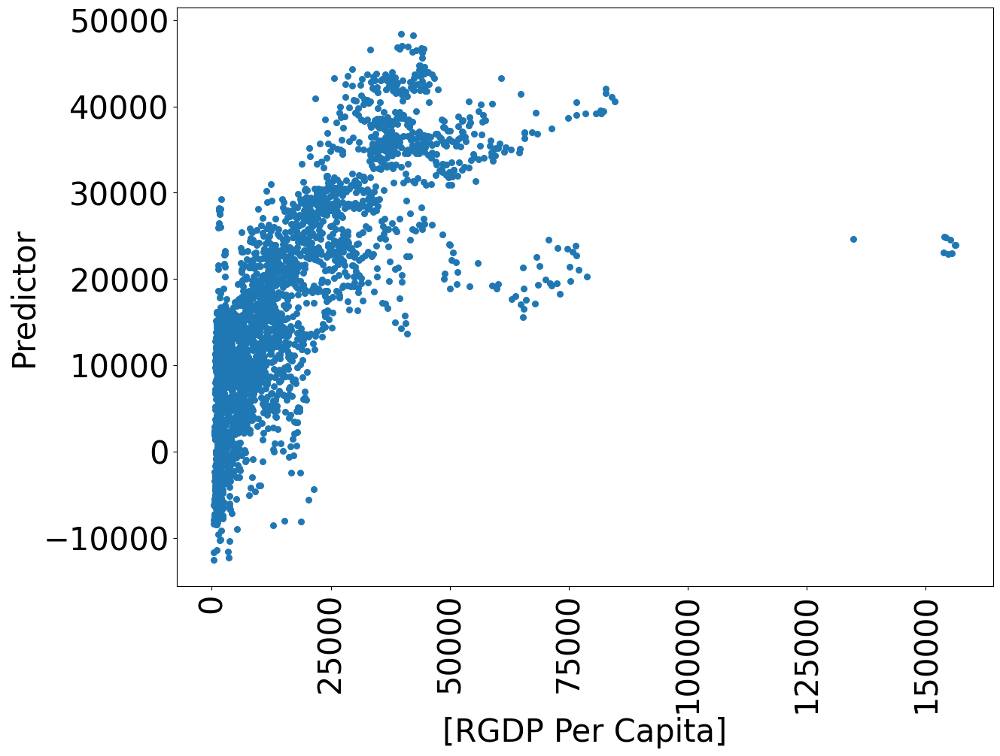

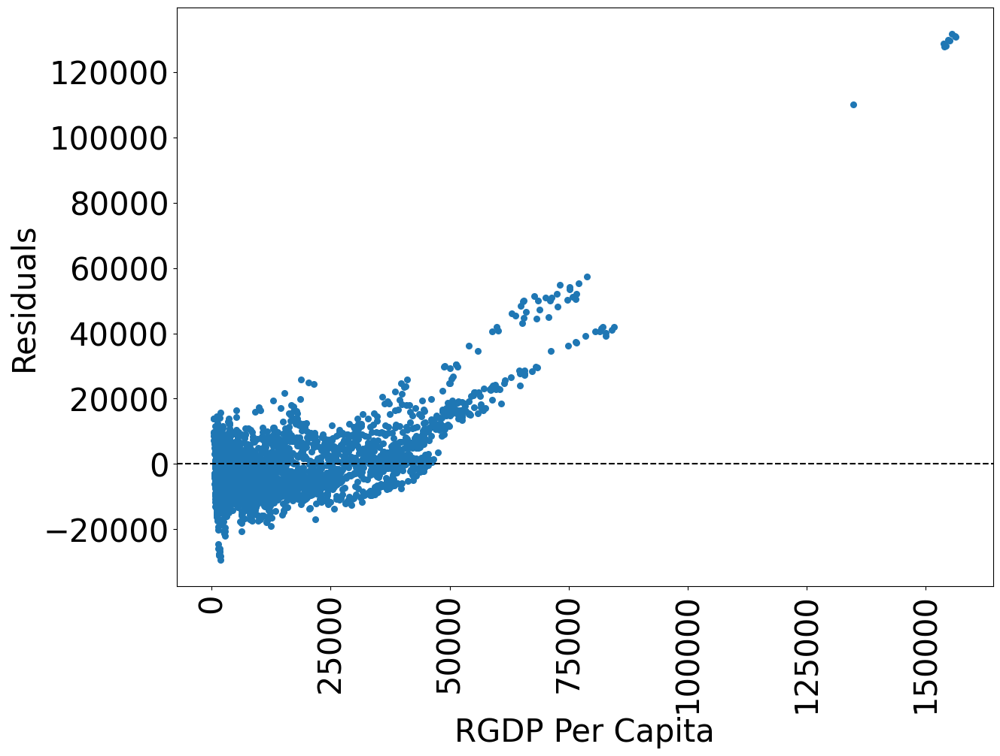

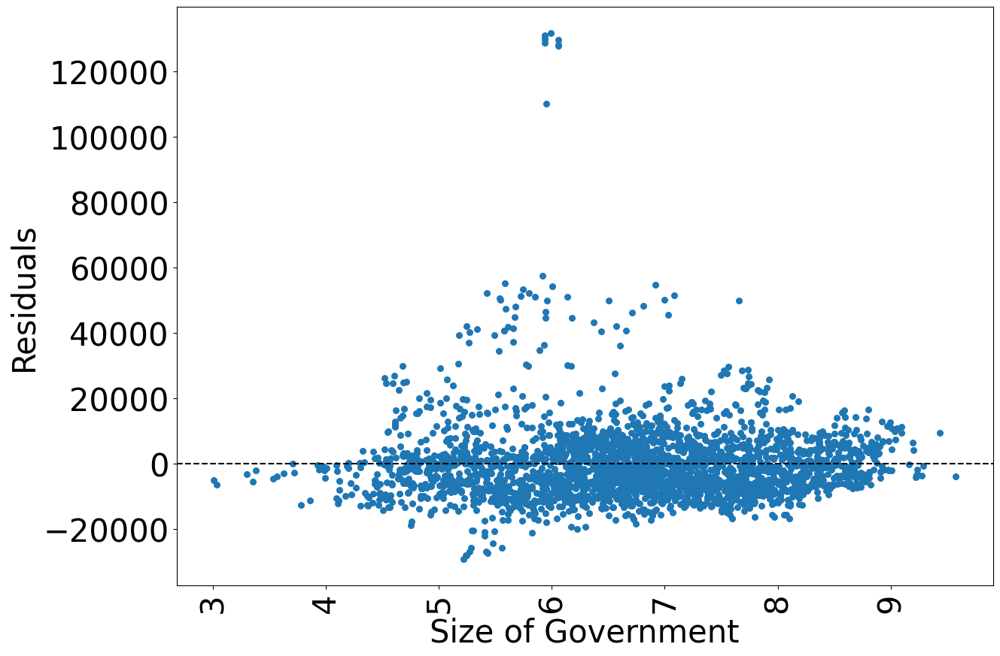

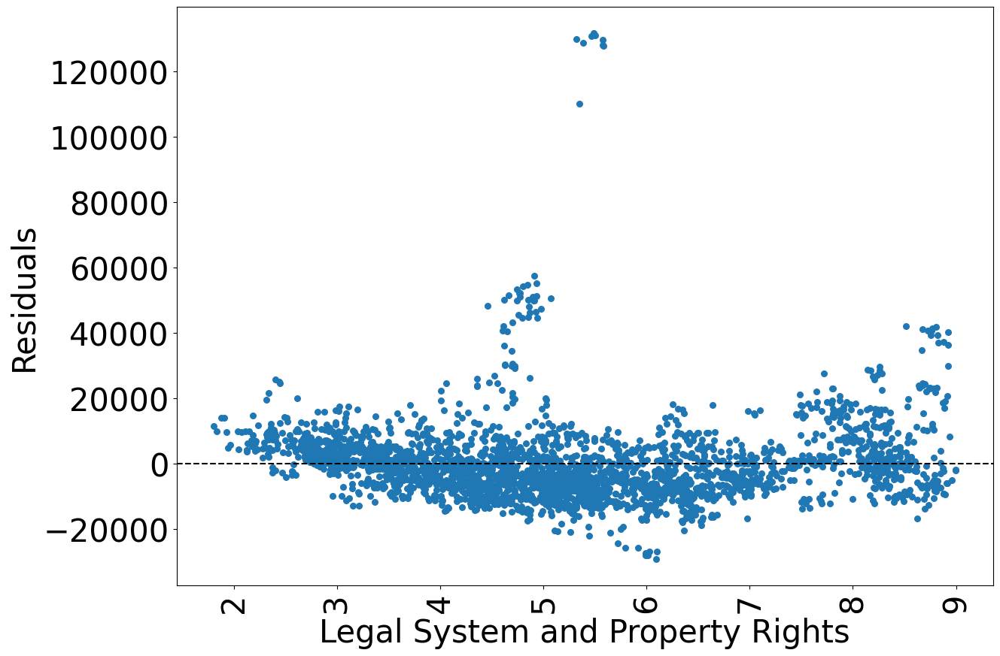

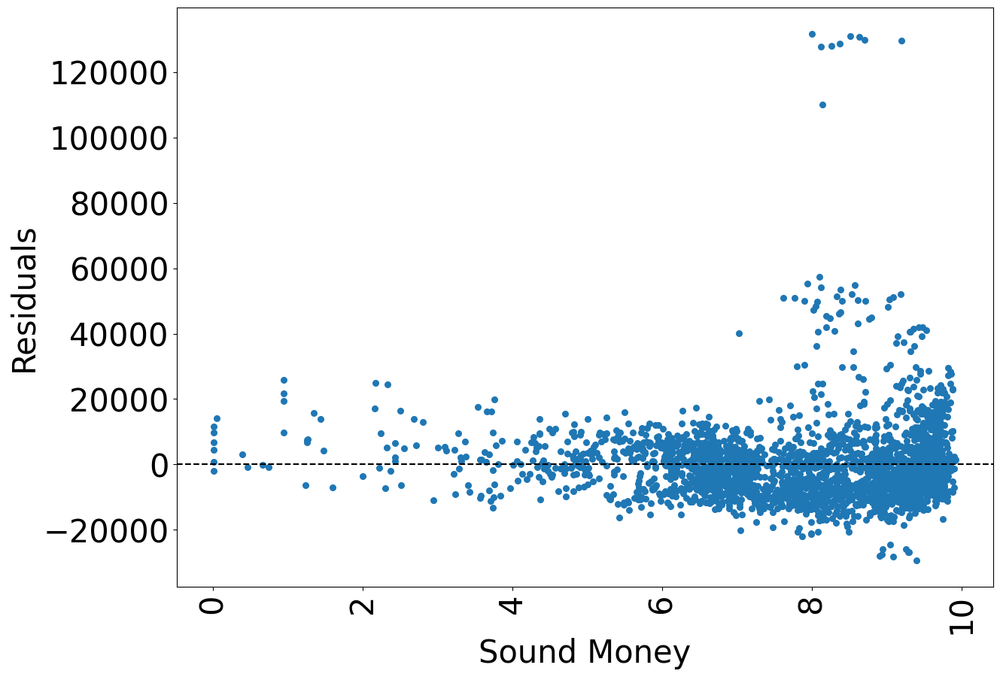

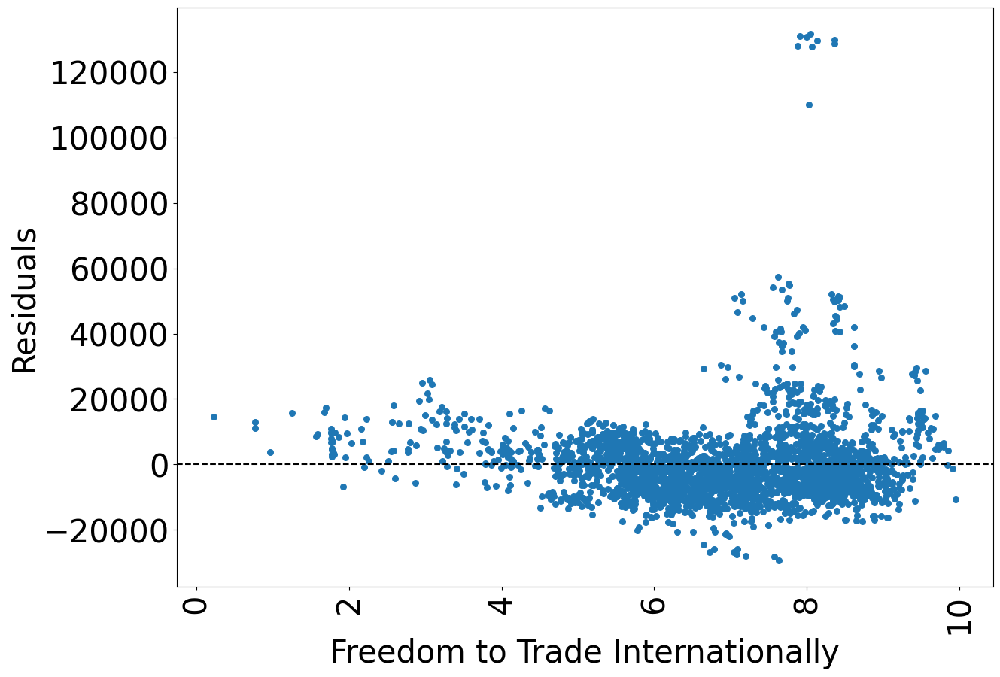

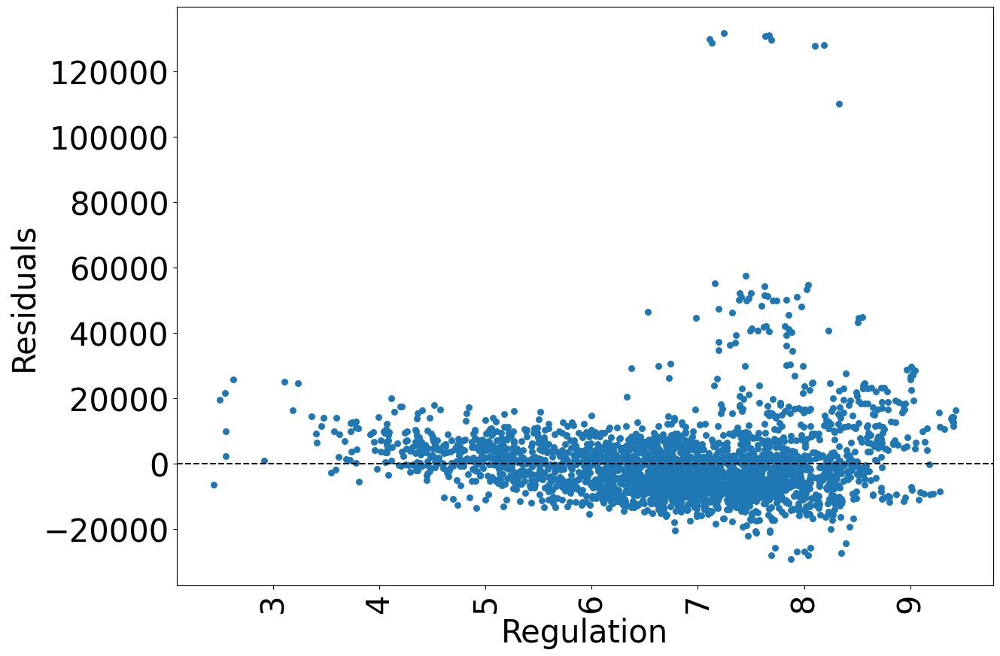

C:\Users\hthog\AppData\Local\Temp\ipykernel_5412\3554147170.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["Constant"] = 1
C:\Users\hthog\AppData\Local\Temp\ipykernel_5412\176663271.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reg_data["Residuals"] = results.resids
C:\Users\hthog\AppData\Local\Temp\ipykernel_5412\176663271.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats 

Entity: False
Time: False
                          PanelOLS Estimation Summary                           
Dep. Variable:        RGDP Per Capita   R-squared:                        0.5021
Estimator:                   PanelOLS   R-squared (Between):              0.4397
No. Observations:                2808   R-squared (Within):              -0.1527
Date:                Tue, Apr 25 2023   R-squared (Overall):              0.5021
Time:                        12:44:21   Log-likelihood                -3.049e+04
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      565.02
Entities:                         165   P-value                           0.0000
Avg Obs:                       17.018   Distribution:                  F(5,2802)
Min Obs:                       0.0000                                           
Max Obs:                       21.000   F-statistic (robust):             60.366
  

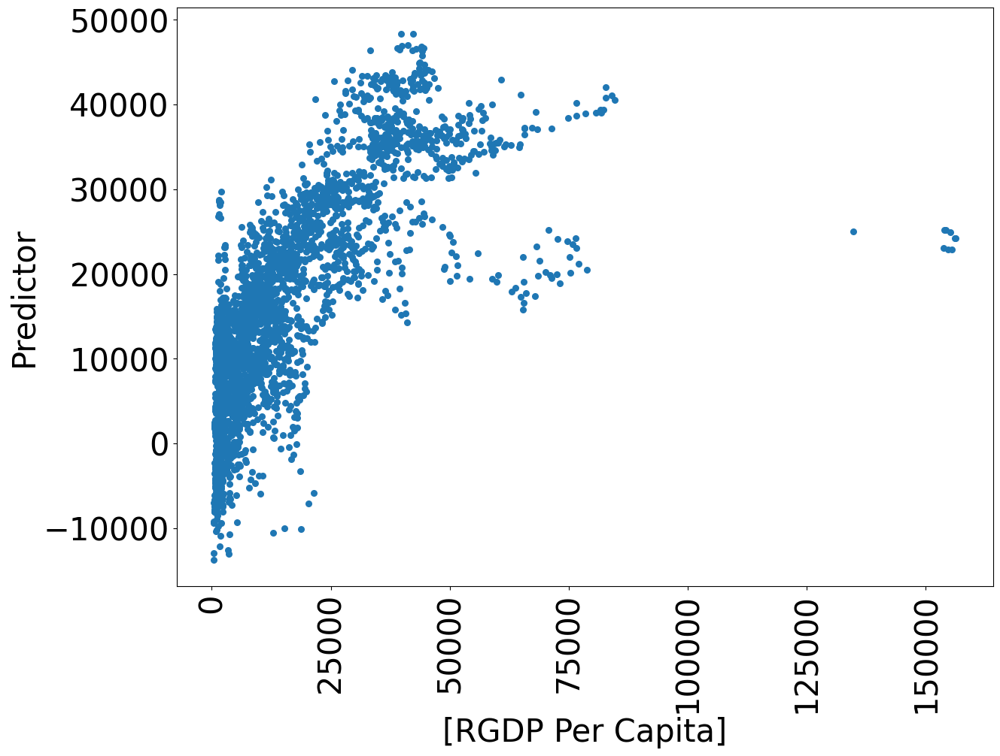

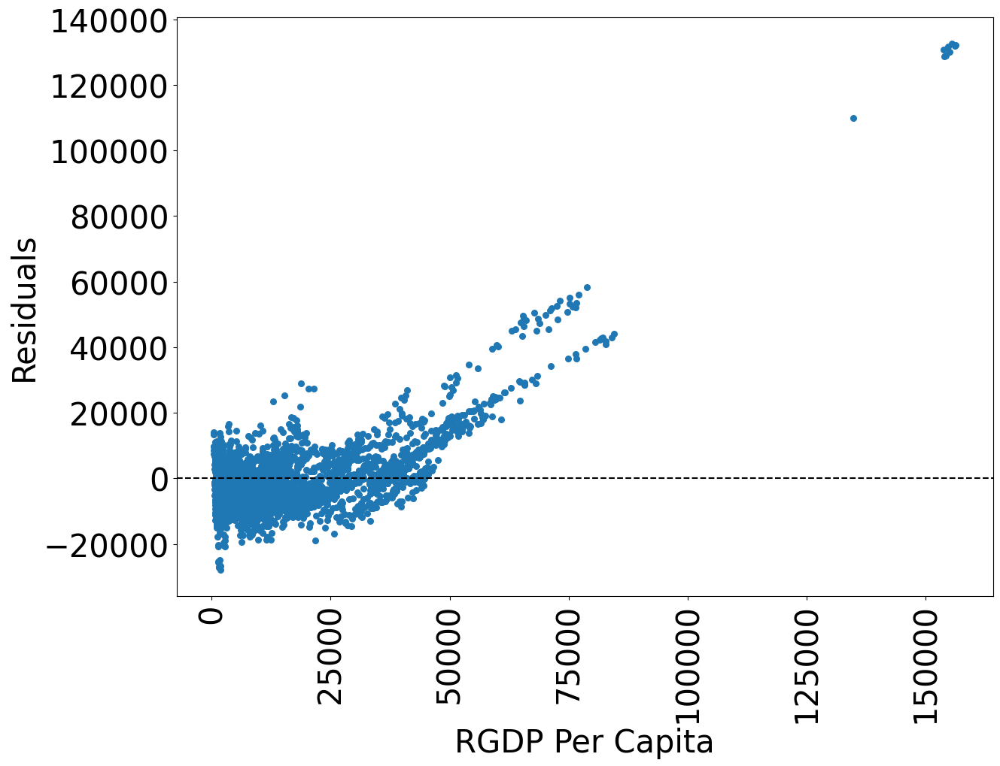

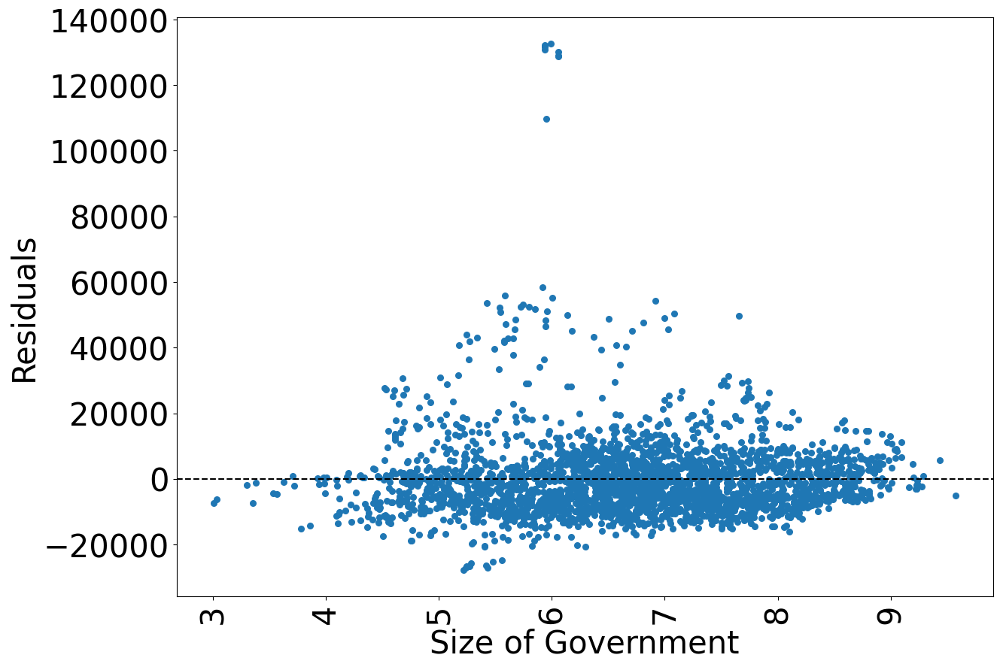

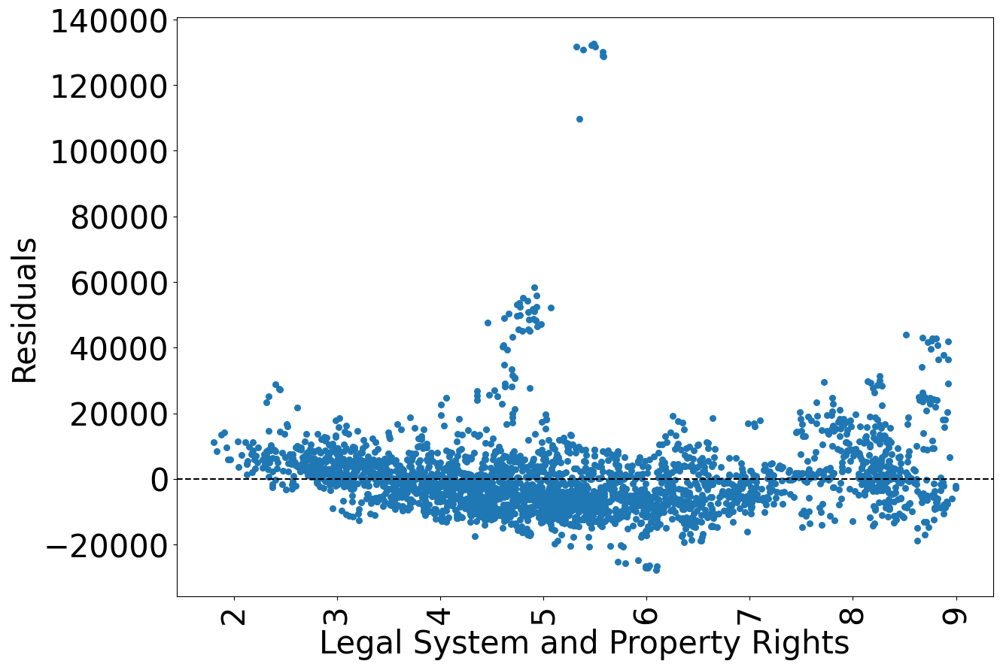

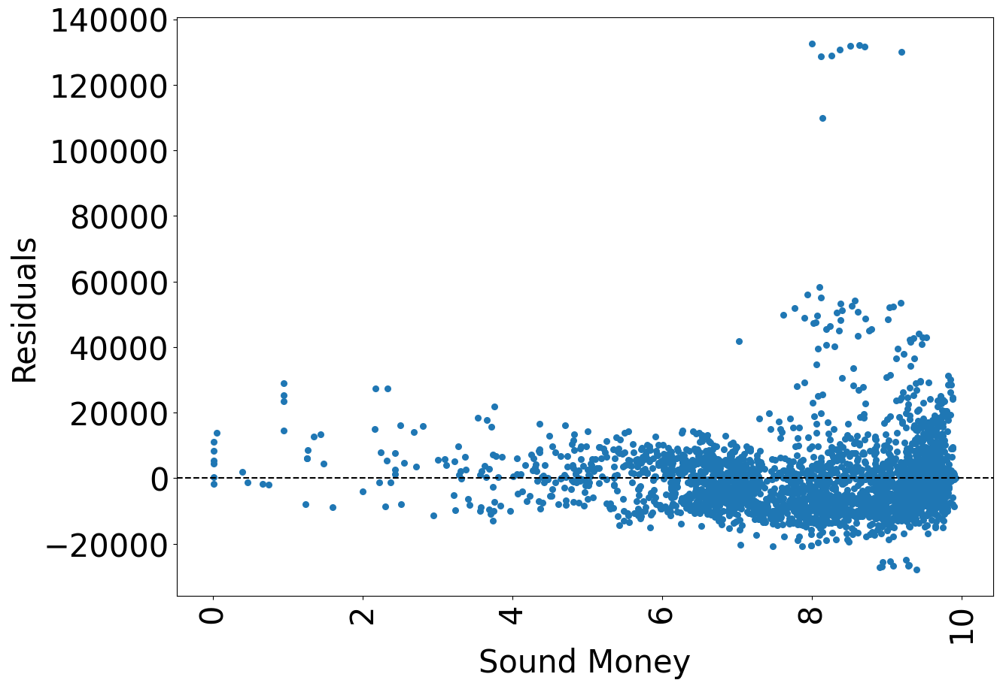

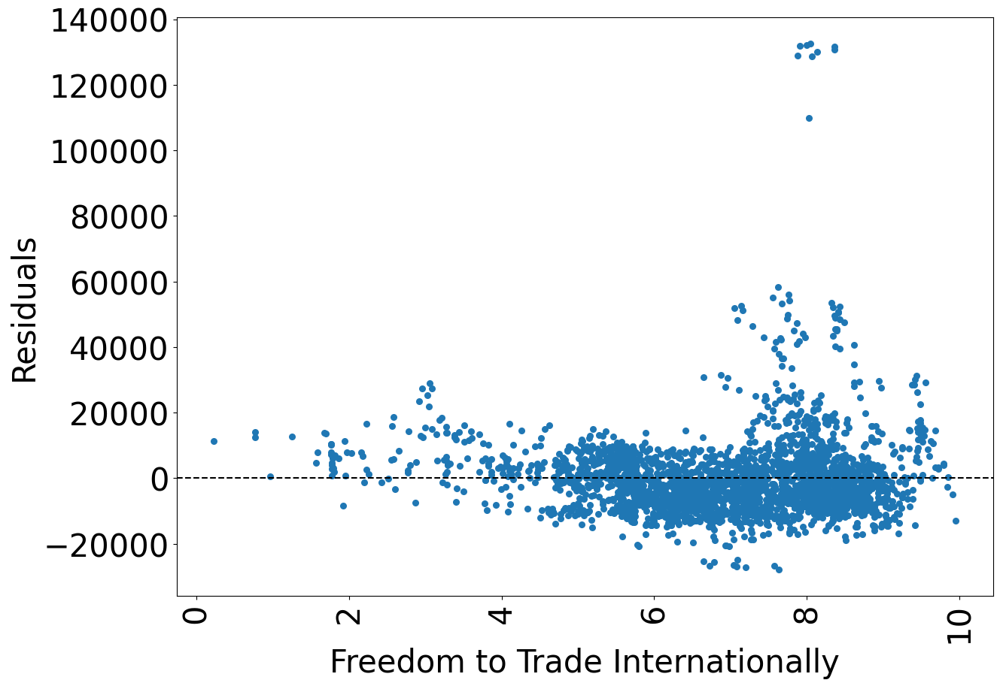

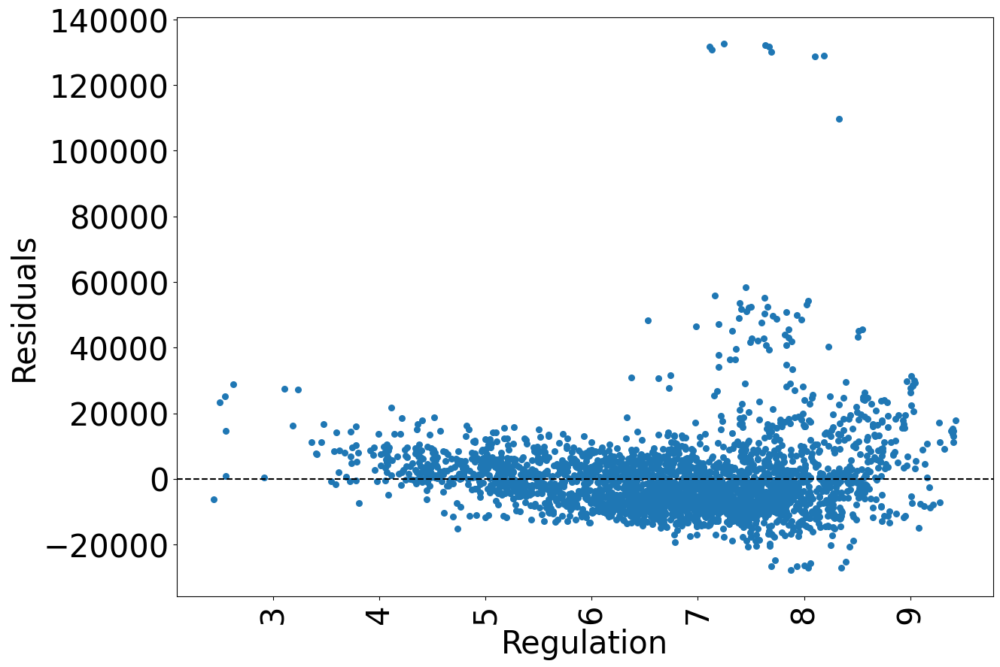

In [38]:
X_names = list(data.keys())[5:10]
y_name = ["RGDP Per Capita"]
for entity in [True, False]:
    for time in [True, False]:
        results  = panel_regress(reg_data, X_names, y_name,
             constant = True,
             entity = entity,
             time = time)
        print("Entity: " + str(entity))
        print("Time: " + str(time))
        print(results)
        reg_data["Residuals"] = results.resids
        reg_data["Predictor"] = results.predict()
        plot_residuals(reg_data, y_name, X_names)